# Figure 4: Assessing the Stability of Meta-analyses through Repeated Subsampling
## Subsamples were rather arbitrarily set to (N = 50, N =  0.2 * Ndomain). 
### Using fixed N favors smaller (sub)BDs but shows the effect of absolute Ns, whereas fixed proportion should facilitate comparison across BDs.
### We also using a sliding proportion approach to see how stability increases as effect of proportion within a (sub)BD.


#### Author: Neville Magielse
#### Date: 07.08.2024

In [1]:
import os
import sys

# User-specified base working directory
BASE_DIR = '/data/project/cerebellum_ale/'  # Change this to your project folder. Make sure they have input and output folders.

# Defines input and output paths.
INPUT_DIR = os.path.join(BASE_DIR, 'input')
OUTPUT_DIR = os.path.join(BASE_DIR, 'output')

sys.path.append(os.path.join(BASE_DIR, 'scripts'))

In [2]:
# Imports
import nimare
from nimare.meta.cbma.ale import ALE
from nimare.correct import FWECorrector

import numpy as np
import pandas as pd
import scipy

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import nilearn.plotting, nilearn.maskers

import nibabel

import SUITPy
import SUITPy.flatmap as flatmap

from tqdm import tqdm

# Font style
plt.rcParams["font.family"] = "Asana Math"
plt.rcParams["font.size"] = 14
plt.rcParams["figure.dpi"] = 192

# Order BDs by their sample size for plotting.

In [29]:
BDs = ['Action', 'Cognition', 'Emotion', 'Interoception',  'Perception']

In [30]:
# Add the number of experiments:
BDs_exps = {
    'Action': 259,
    'Cognition': 750,
    'Emotion': 225,
    'Interoception': 70,
    'Perception': 355
}

In [31]:
BDs_order = pd.Series(BDs_exps).sort_values().index

In [6]:
# For the 0.2-proportional subsampling, add the number of experiments from the total (for plotting).
BDs_exps_sample = {
    'Action': 52,
    'Cognition': 150,
    'Emotion': 45,
    'Interoception': 14, # Not enough for proportion = 0.2 subsampling.
    'Perception': 71
}

In [7]:
# Open dictionaries, we will keep overwriting these throughout this notebook.
zmaps = {}
surf_zmaps = {}
corrs = {}
corrs_tril = {}

# First, 50 experiments per subsample.
## For each step, we will just get the necessary data. The plotting of the figures in this notebook should thus be modular. :) 

In [8]:
# Import data for each BD
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_n-50')
    for subsample in tqdm(range(50)):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'uncorr_z.nii.gz') # For boxplot visualisation, highlighting correlation between full, unthresholded z-maps is most revealing.
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space set to 'SPM' to match the BrainMap database.
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  9.03it/s]


In [9]:
corrs[analysis] = {}
corrs_tril[analysis] = {}
for bd in BDs:
    corrs[analysis][bd] = np.corrcoef(surf_zmaps[analysis][bd])
    corrs_tril[analysis][bd] = corrs[analysis][bd][np.tril_indices(50, -1)]

In [10]:
corrs_long = pd.DataFrame(corrs_tril[analysis]).unstack().reset_index()
corrs_long.columns = ['BD', 'pair', 'corr']

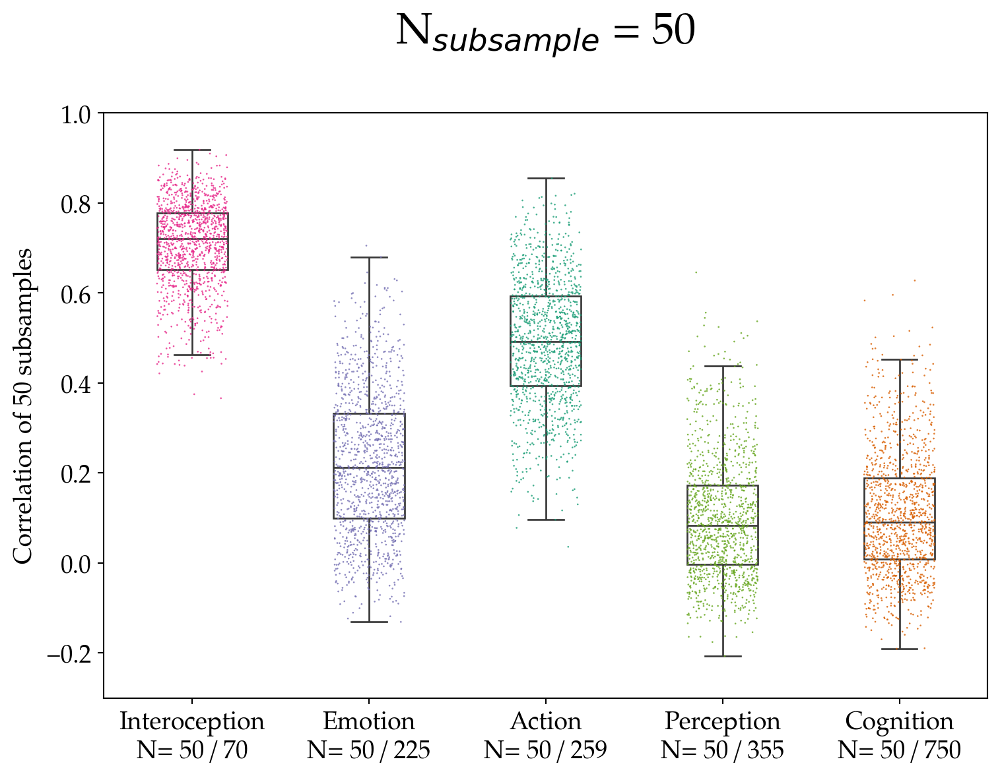

In [11]:
# Boxplots for within-BD spatial correlations of subsamples (N = 50).

# Create a new figure
fig, ax = plt.subplots(figsize=(9, 6))

# Make the background transparent
fig.patch.set_facecolor('none')

# Make the background of plotting area transparent
ax.patch.set_facecolor('none')

# Use the first 5 colors from the Dark2 colormap
colors = sns.color_palette("Dark2", n_colors=5)

sns.stripplot(data=corrs_long, x='BD', y='corr', 
              order=BDs_order, jitter=0.2,
              s=1, alpha=0.8, ax=ax, hue='BD', palette=colors, legend=False) # Chose quite a high alpha to have poppy colors.
sns.boxplot(data=corrs_long, x='BD', y='corr',
            order=BDs_order,
            showfliers=False, showcaps=True, width=0.4,
            boxprops={"facecolor": (1, 1, 1, 1)}, ax=ax, hue='BD', palette=colors, legend=False)
ax.set_xlabel('')
ax.set_ylabel('Correlation of 50 subsamples')
ax.set_title('N$_{subsample}$ = 50', y=1.1, fontsize=25)

# Create x-axis labels for BDs with sample size information.
ax.set_xticks(range(len(BDs_order)))
ax.set_xticklabels([f'{BD}\nN= 50 / {BDs_exps[BD]}' for BD in BDs_order], rotation=0, ha='center')

ax.set_ylim([-0.3, 1])

plt.show()


In [12]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/Domains_SpatialCorrelations_N50.png'), bbox_inches='tight')

# Then, the 0.2-proportion subsampling for the BDs.

In [13]:
# Import data
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_p-02')
    for subsample in tqdm(range(50)):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'uncorr_z.nii.gz')
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space to match BrainMap.
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:02<00:00, 17.27it/s]


In [21]:
corrs[analysis] = {}
corrs_tril[analysis] = {}
for bd in BDs:
    corrs[analysis][bd] = np.corrcoef(surf_zmaps[analysis][bd])
    corrs_tril[analysis][bd] = corrs[analysis][bd][np.tril_indices(50, -1)]

In [22]:
corrs_long = pd.DataFrame(corrs_tril[analysis]).unstack().reset_index()
corrs_long.columns = ['BD', 'pair', 'corr']

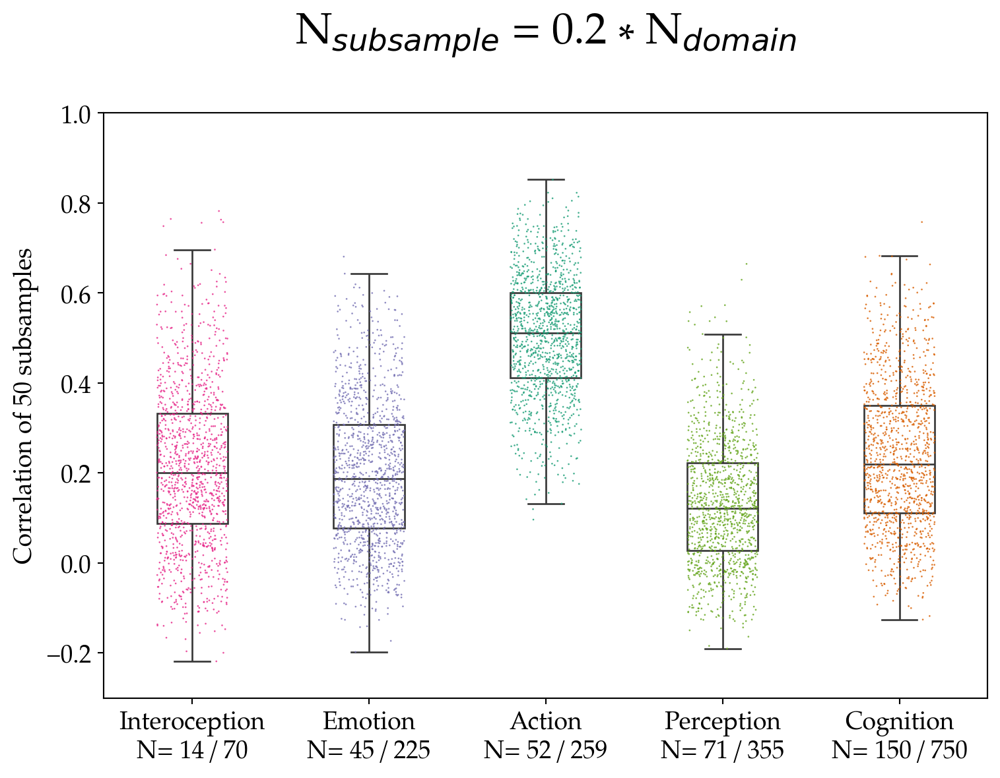

In [23]:
# Create a new figure
fig, ax = plt.subplots(figsize=(9, 6))

# Make the background transparent
fig.patch.set_facecolor('none')

# Make the background of plotting area transparent
ax.patch.set_facecolor('none')

# Use the first 5 colors from the Dark2 colormap
colors = sns.color_palette("Dark2", n_colors=5)

sns.stripplot(data=corrs_long, x='BD', y='corr', 
              order=BDs_order, jitter=0.2,
              s=1, alpha=0.8, ax=ax, hue='BD', palette=colors, legend=False)
sns.boxplot(data=corrs_long, x='BD', y='corr',
            order=BDs_order,
            showfliers=False, showcaps=True, width=0.4,
            boxprops={"facecolor": (1, 1, 1, 1)}, ax=ax, hue='BD', palette=colors, legend=False)
ax.set_xlabel('')
ax.set_ylabel('Correlation of 50 subsamples')
ax.set_title('N$_{subsample}$ = 0.2 * N$_{domain}$', y=1.1, fontsize=25)

# Add x-axis labels with subsample size information.
ax.set_xticks(range(len(BDs_order)))
ax.set_xticklabels([f'{BD}\nN= {BDs_exps_sample[BD]} / {BDs_exps[BD]}' for BD in BDs_order], rotation=0, ha='center')

ax.set_ylim([-0.3, 1])

plt.show()

In [25]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/Domains_SpatialCorrelations_p02.png'), bbox_inches='tight') # Note that Interoception has a subsample size that is too small for stable meta-analysis.

# Next up are the subdomains.
### Note that not all subdomains were subsampled. We only performed this analysis for subdomains with Nexperiments > 75, to assure they are of appropriate size. (75 * 0.2 = 15, which should allow for stable MA)

In [8]:
subdomains = ['Action.Execution', 'Cognition.Attention', 'Cognition.Language', 'Cognition.Language.Semantics', 'Cognition.Language.Speech', 'Cognition.Memory', 'Cognition.Memory.Explicit', 'Cognition.Memory.Working', 'Cognition.Reasoning', 'Emotion.Negative','Emotion.Positive', 'Emotion.Positive.RewardGain', 'Perception.Audition', 'Perception.Somesthesis', 'Perception.Somesthesis.Pain', 'Perception.Vision', 'Perception.Vision.Shape']


In [9]:
# Add the number of experiments per subdomain.
subdomains_exps = {'Action.Execution': 198,
                  'Cognition.Attention': 224,
                  'Cognition.Memory': 219,
                  'Cognition.Memory.Explicit': 102,
                  'Cognition.Language': 201,
                  'Cognition.Language.Semantics': 121,
                   'Cognition.Language.Speech': 83,
                  'Cognition.Memory.Working': 113,
                  'Cognition.Reasoning': 111,
                  'Emotion.Positive': 135,
                  'Emotion.Negative': 115,
                   'Emotion.Positive.RewardGain': 82,
                   'Perception.Audition': 61,
                   'Perception.Somesthesis': 90,
                   'Perception.Somesthesis.Pain': 65,
                  'Perception.Vision': 186,
                   'Perception.Vision.Shape': 65
}

In [10]:
subdomains_order = pd.Series(subdomains_exps).sort_values().index

In [11]:
# Add nicer labels 
subdomains_labels = {'Action.Execution': 'Execution', 
'Cognition.Attention': 'Attention', 'Cognition.Language': 'Language' , 'Cognition.Language.Semantics': 'Semantics', 'Cognition.Language.Speech': 'Speech', 
'Cognition.Memory': 'Memory', 'Cognition.Memory.Explicit': 'Explicit Memory', 'Cognition.Memory.Working': 'Working Memory', 'Cognition.Reasoning': 'Reasoning', 
'Emotion.Negative': 'Negative Emotion','Emotion.Positive': 'Positive Emotion', 'Emotion.Positive.RewardGain': 'Reward/ Gain', 
'Perception.Audition': 'Audition', 'Perception.Somesthesis': 'Somesthesis', 'Perception.Somesthesis.Pain': 'Pain', 'Perception.Vision': 'Vision', 'Perception.Vision.Shape': 'Vision - Shape'
  
}

In [12]:
# For subdomains, we map their colors to the BD under which they are indexed in BrainMap.

# Get the Dark2 colormap
cmap = plt.get_cmap('Dark2')

# Get the colors as RGB tuples
colors_rgb = [cmap(i) for i in range(5)]

# Convert RGB tuples to hex codes
colors_hex = [mcolors.rgb2hex(rgb) for rgb in colors_rgb]

# Print the hex codes
print(colors_hex)

['#1b9e77', '#d95f02', '#7570b3', '#e7298a', '#66a61e']


In [13]:
# Subdomain to domain mapping
subdomain_domain_mapping = {'Action.Execution': 'Action', 
                            'Cognition.Attention': 'Cognition', 
                            'Cognition.Language': 'Cognition', 
                            'Cognition.Language.Semantics': 'Cognition', 
                            'Cognition.Language.Speech': 'Cognition', 
                            'Cognition.Memory': 'Cognition', 
                            'Cognition.Memory.Explicit': 'Cognition', 
                            'Cognition.Memory.Working': 'Cognition', 
                            'Cognition.Reasoning': 'Cognition', 
                            'Emotion.Negative': 'Emotion',
                            'Emotion.Positive': 'Emotion',
                            'Emotion.Positive.RewardGain': 'Emotion',
                             'Perception.Audition': 'Perception',
                            'Perception.Somesthesis': 'Perception', 
                             'Perception.Somesthesis.Pain': 'Perception',
                            'Perception.Vision': 'Perception',
                             'Perception.Vision.Shape': 'Perception'
                           }

# First, N = 50 subsamples.

In [65]:
# Add unthresholded z-maps.
analysis = 'SALE'
#zmaps[analysis] = {}
#surf_zmaps[analysis] = {}

for bd in BDs:
    for subdomain in subdomains:
        subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, subdomain, 'subsamples_n-50')
        
        # Check if the directory exists before starting processing.
        if os.path.exists(subsamples_dir):
            zmaps[analysis][subdomain] = []
            surf_zmaps[analysis][subdomain] = []
            
            for subsample in tqdm(range(50)):
                zmap_path = os.path.join(subsamples_dir, str(subsample), 'uncorr_z.nii.gz')
                
                # Check if the file exists before loading and adding to lists
                if os.path.exists(zmap_path):
                    zmaps[analysis][subdomain].append(nibabel.load(zmap_path))
                    surf_zmaps[analysis][subdomain].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space.
                else:
                    print(f"File not found: {zmap_path}")
            
            # Convert to np.array only if data is present
            if surf_zmaps[analysis][subdomain]:
                surf_zmaps[analysis][subdomain] = np.array(surf_zmaps[analysis][subdomain])
            else:
                print(f"No data found for {bd} - {subdomain}")
        else:
            print(f"Directory not found: {subsamples_dir}")

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.90it/s]


Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Attention/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Language/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Language.Semantics/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Language.Speech/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Memory/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Memory.Explicit/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Memory.Working/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Reasoning/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Emotion.Negative/subsamples_n-50
Directory not found: /data/project/c

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.72it/s]


Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Emotion.Negative/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Emotion.Positive/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Emotion.Positive.RewardGain/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Audition/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Somesthesis/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Somesthesis.Pain/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Vision/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Vision.Shape/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Action.Execution/subsamples_n-50
Directory not foun

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.48it/s]


Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Audition/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Somesthesis/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Somesthesis.Pain/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Vision/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Vision.Shape/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Action.Execution/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Cognition.Attention/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Cognition.Language/subsamples_n-50
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Cognition.Language.Semantics/subsamples_n-50
Dire

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.85it/s]


In [66]:
# Create the correlation matrix
corrs[analysis] = {}
corrs_tril[analysis] = {}
for subdomain in subdomains:
    surf_data = surf_zmaps[analysis][subdomain]
    
    # Check if there is sufficient data for correlation calculation
    if len(surf_data) > 1:
        # Calculate correlation matrix
        corr_matrix = np.corrcoef(surf_data)
        
        # Flatten the lower triangular part of the correlation matrix
        corrs_tril[analysis][subdomain] = corr_matrix[np.tril_indices(corr_matrix.shape[0], -1)]
        
        # Store the full correlation matrix
        corrs[analysis][subdomain] = corr_matrix
    else:
        print(f"Insufficient data for correlation calculation for {subdomain}")

In [67]:
# Transform to long format
corrs_long = pd.DataFrame(corrs_tril[analysis]).unstack().reset_index()
corrs_long.columns = ['subdomain', 'pair', 'corr']

In [68]:
# Interoception was not present in the subdomain subsamples data (none N > 100).
# Hence, we manually mapped the colors so they still correspond to the BD colors.

domain_colors_dict = {
    'Action': '#1b9e77',
    'Perception': '#66a61e', 
    #'Interoception': '#e7298a', ## This can be uncommented and should still work.
    'Cognition': '#d95f02',
    'Emotion': '#7570b3'
}

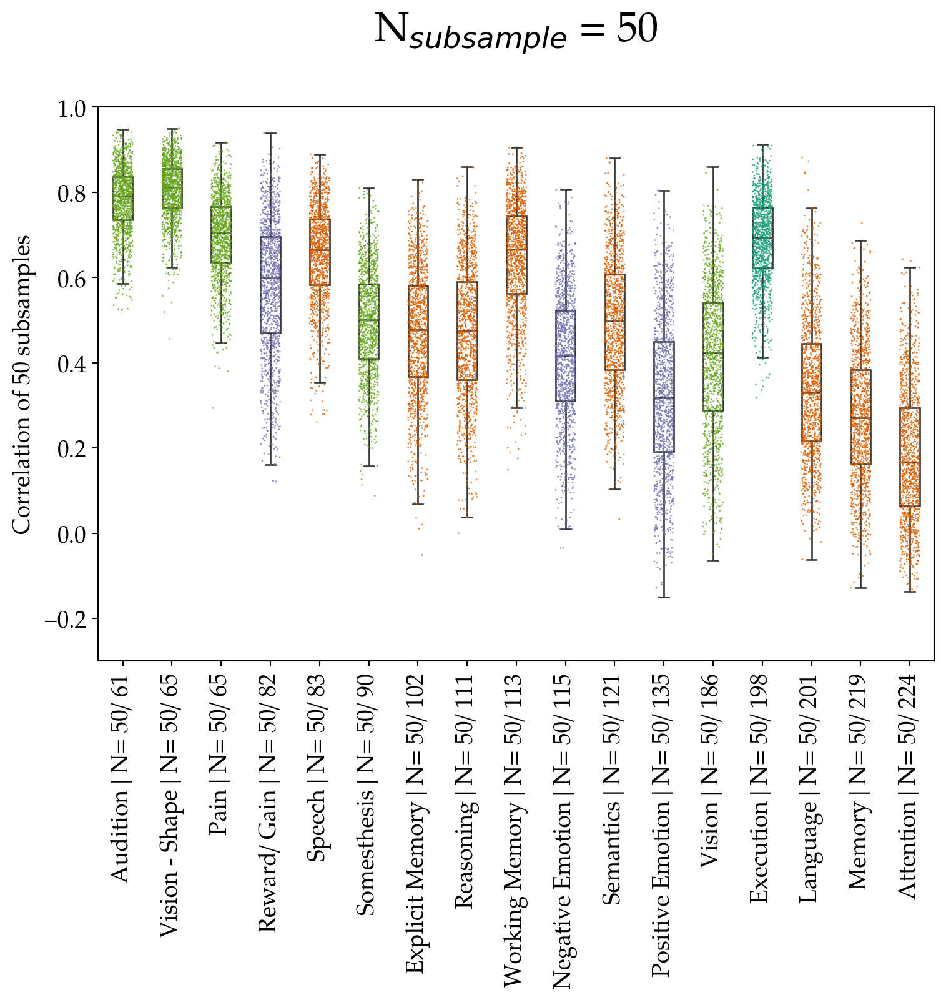

In [69]:
# Mapping each subdomain to the domain colors
subdomain_colors = {subdomain: domain_colors_dict[subdomain_domain_mapping[subdomain]] for subdomain in subdomain_domain_mapping}

# Plotting is as it was before

# Create a new figure
fig, ax = plt.subplots(figsize=(9, 6))

# Set backgrounds to transparent
fig.patch.set_facecolor('none')
ax.patch.set_facecolor('none')

sns.stripplot(data=corrs_long, x='subdomain', y='corr', 
              order=subdomains_order, jitter=0.2,
              s=1, alpha=0.8, ax=ax, hue='subdomain', palette=subdomain_colors, legend=False) # Here we use the new colormapping.

sns.boxplot(data=corrs_long, x='subdomain', y='corr',
            order=subdomains_order,
            showfliers=False, showcaps=True, width=0.4,
            boxprops={"facecolor": (1, 1, 1, 1)}, ax=ax, hue='subdomain', palette=subdomain_colors, legend=False) # Here we use the new colormapping.

ax.set_xlabel('')
ax.set_ylabel('Correlation of 50 subsamples')
ax.set_title('N$_{subsample}$ = 50', y=1.1, fontsize=25)


ax.set_xticks(range(len(subdomains_order)))
ax.set_xticklabels([f'{subdomains_labels[subdomain]} | N= 50/ {subdomains_exps[subdomain]}' for subdomain in subdomains_order], rotation=90, ha='center')

ax.set_ylim([-0.3, 1])

plt.show()

In [70]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/Subdomains_SpatialCorrelations_N50.png'), bbox_inches='tight') # Note that several of the smaller (perception) subdomains have high stability due to the subsample proportion being very high.

# Then, 0.2 proportion

In [71]:
subdomains = ['Action.Execution', 'Cognition.Attention', 'Cognition.Language', 'Cognition.Language.Semantics', 'Cognition.Language.Speech', 'Cognition.Memory', 'Cognition.Memory.Explicit', 'Cognition.Memory.Working', 'Cognition.Reasoning', 'Emotion.Negative','Emotion.Positive', 'Emotion.Positive.RewardGain', 'Perception.Somesthesis', 'Perception.Vision']


In [72]:
# Add the number of experiments per subdomain.
subdomains_exps = {'Action.Execution': 198,
                  'Cognition.Attention': 224,
                  'Cognition.Memory': 219,
                  'Cognition.Memory.Explicit': 102,
                  'Cognition.Language': 201,
                  'Cognition.Language.Semantics': 121,
                   'Cognition.Language.Speech': 83,
                  'Cognition.Memory.Working': 113,
                  'Cognition.Reasoning': 111,
                  'Emotion.Positive': 135,
                  'Emotion.Negative': 115,
                   'Emotion.Positive.RewardGain': 82,
                   'Perception.Somesthesis': 90,
                  'Perception.Vision': 186,
}

In [73]:
subdomains_order = pd.Series(subdomains_exps).sort_values().index

In [74]:
# Add the number of experiments per subdomain.
subdomains_exps_sample = {'Action.Execution': 40,
                  'Cognition.Attention': 45,
                  'Cognition.Memory': 44,
                  'Cognition.Memory.Explicit': 20,
                  'Cognition.Language': 40,
                  'Cognition.Language.Semantics': 24,
                   'Cognition.Language.Speech': 17,
                  'Cognition.Memory.Working': 23,
                  'Cognition.Reasoning': 22,
                  'Emotion.Positive': 27,
                  'Emotion.Negative': 23,
                   'Emotion.Positive.RewardGain': 16,
                   'Perception.Somesthesis': 18,
                  'Perception.Vision': 37,
}

In [75]:
# Add nicer labels 
subdomains_labels = {'Action.Execution': 'Execution', 
'Cognition.Attention': 'Attention', 'Cognition.Language': 'Language' , 'Cognition.Language.Semantics': 'Semantics', 'Cognition.Language.Speech': 'Speech', 
'Cognition.Memory': 'Memory', 'Cognition.Memory.Explicit': 'Explicit Memory', 'Cognition.Memory.Working': 'Working Memory', 'Cognition.Reasoning': 'Reasoning', 
'Emotion.Negative': 'Negative Emotion','Emotion.Positive': 'Positive Emotion', 'Emotion.Positive.RewardGain': 'Reward/ Gain', 
'Perception.Somesthesis': 'Somesthesis', 'Perception.Vision': 'Vision'
  
}

In [76]:
# For subdomains, we map their colors to the BD under which they are indexed in BrainMap.

# Get the Dark2 colormap
cmap = plt.get_cmap('Dark2')

# Get the colors as RGB tuples
colors_rgb = [cmap(i) for i in range(5)]

# Convert RGB tuples to hex codes
colors_hex = [mcolors.rgb2hex(rgb) for rgb in colors_rgb]

# Print the hex codes
print(colors_hex)

['#1b9e77', '#d95f02', '#7570b3', '#e7298a', '#66a61e']


In [77]:
# Subdomain to domain mapping
subdomain_domain_mapping = {'Action.Execution': 'Action', 
                            'Cognition.Attention': 'Cognition', 
                            'Cognition.Language': 'Cognition', 
                            'Cognition.Language.Semantics': 'Cognition', 
                            'Cognition.Language.Speech': 'Cognition', 
                            'Cognition.Memory': 'Cognition', 
                            'Cognition.Memory.Explicit': 'Cognition', 
                            'Cognition.Memory.Working': 'Cognition', 
                            'Cognition.Reasoning': 'Cognition', 
                            'Emotion.Negative': 'Emotion',
                            'Emotion.Positive': 'Emotion',
                            'Emotion.Positive.RewardGain': 'Emotion', 
                            'Perception.Somesthesis': 'Perception', 
                            'Perception.Vision': 'Perception'
                           }

In [78]:
# Add the new data.
analysis = 'SALE'

for bd in BDs:
    for subdomain in subdomains:
        subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, subdomain, 'subsamples_p-02')
        
        # Check if the directory exists before processing
        if os.path.exists(subsamples_dir):
            zmaps[analysis][subdomain] = []
            surf_zmaps[analysis][subdomain] = []
            
            for subsample in tqdm(range(50)):
                zmap_path = os.path.join(subsamples_dir, str(subsample), 'uncorr_z.nii.gz')
                
                # Check if the file exists before loading and adding to lists
                if os.path.exists(zmap_path):
                    zmaps[analysis][subdomain].append(nibabel.load(zmap_path))
                    surf_zmaps[analysis][subdomain].append(SUITPy.flatmap.vol_to_surf(zmap_path, space = 'SPM').squeeze()) # Space set to match BrainMap data.
                else:
                    print(f"File not found: {zmap_path}")
            
            # Convert to np.array only if data is present
            if surf_zmaps[analysis][subdomain]:
                surf_zmaps[analysis][subdomain] = np.array(surf_zmaps[analysis][subdomain])
            else:
                print(f"No data found for {bd} - {subdomain}")
        else:
            print(f"Directory not found: {subsamples_dir}")

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.00it/s]


Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Attention/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Language/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Language.Semantics/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Language.Speech/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Memory/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Memory.Explicit/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Memory.Working/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Cognition.Reasoning/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Action/Emotion.Negative/subsamples_p-02
Directory not found: /data/project/c

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.95it/s]


Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Emotion.Negative/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Emotion.Positive/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Emotion.Positive.RewardGain/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Somesthesis/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Cognition/Perception.Vision/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Action.Execution/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Cognition.Attention/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Cognition.Language/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Cognition.Language.Semantics/subsamples_p-02
Directory not found: /data/p

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.38it/s]


Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Somesthesis/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Emotion/Perception.Vision/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Action.Execution/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Cognition.Attention/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Cognition.Language/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Cognition.Language.Semantics/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Cognition.Language.Speech/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Cognition.Memory/subsamples_p-02
Directory not found: /data/project/cerebellum_ale/output/SALE/Interoception/Cognition.Memory.Explicit/subsa

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.28it/s]


In [79]:
# Create full correlation matrix
corrs[analysis] = {}
corrs_tril[analysis] = {}
for subdomain in subdomains:
    surf_data = surf_zmaps[analysis][subdomain]
    
    # Check if there is sufficient data for correlation
    if len(surf_data) > 1:
        # Calculate correlation matrix
        corr_matrix = np.corrcoef(surf_data)
        
        # Flatten the lower triangular part of the correlation matrix
        corrs_tril[analysis][subdomain] = corr_matrix[np.tril_indices(corr_matrix.shape[0], -1)]
        
        # Store the full correlation matrix
        corrs[analysis][subdomain] = corr_matrix
    else:
        print(f"Insufficient data for correlation calculation for {subdomain}")

In [80]:
# Transform to long format
corrs_long = pd.DataFrame(corrs_tril[analysis]).unstack().reset_index()
corrs_long.columns = ['subdomain', 'pair', 'corr']

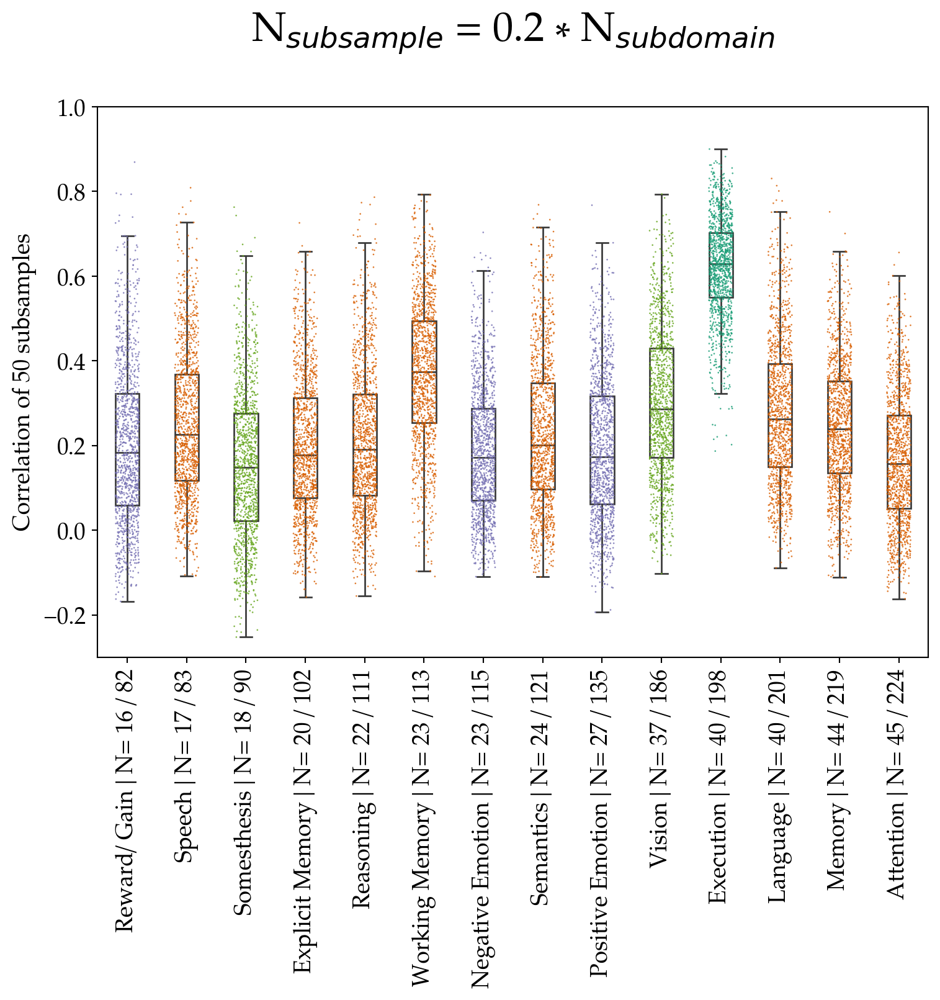

In [81]:
# Mapping each subdomain to the domain colors
subdomain_colors = {subdomain: domain_colors_dict[subdomain_domain_mapping[subdomain]] for subdomain in subdomain_domain_mapping}

# Plotting as it was before

# Create a new figure
fig, ax = plt.subplots(figsize=(9, 6))

# Set backgrounds to transparent
fig.patch.set_facecolor('none')
ax.patch.set_facecolor('none')

sns.stripplot(data=corrs_long, x='subdomain', y='corr', 
              order=subdomains_order, jitter=0.2,
              s=1, alpha=0.8, ax=ax, hue='subdomain', palette=subdomain_colors, legend=False)

sns.boxplot(data=corrs_long, x='subdomain', y='corr',
            order=subdomains_order,
            showfliers=False, showcaps=True, width=0.4,
            boxprops={"facecolor": (1, 1, 1, 1)}, ax=ax, hue='subdomain', palette=subdomain_colors, legend=False)

ax.set_xlabel('')
ax.set_ylabel('Correlation of 50 subsamples')
ax.set_title('N$_{subsample}$ = 0.2 * N$_{subdomain}$', y=1.1, fontsize=25)


ax.set_xticks(range(len(subdomains_order)))
ax.set_xticklabels([f'{subdomains_labels[subdomain]} | N= {subdomains_exps_sample[subdomain]} / {subdomains_exps[subdomain]}' for subdomain in subdomains_order], rotation=90, ha='center')

ax.set_ylim([-0.3, 1])

plt.show()

In [82]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/Subdomains_SpatialCorrelations_p02.png'), bbox_inches='tight')

# For the sliding-N subsampling (Domains/ BDs only)
## This was done for all BDs/ subdomains with N > 100 (to be able to go up to NSubsample = 100).

In [74]:
# Import data for each BD - here we have to specify the path of the subdirectories containing the different subsample sizes (N).

# These are the subsample directory names
subsample_dirs = ['subsamples_n-25', 'subsamples_n-50', 'subsamples_n-75', 'subsamples_n-100']  # Note that we reuse the N = 50 subsampling from earlier.

analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}

# Loop through each BD
for bd in BDs_order:
    zmaps[analysis][bd] = {subdir: [] for subdir in subsample_dirs}
    surf_zmaps[analysis][bd] = {subdir: [] for subdir in subsample_dirs}

    # Loop through each subsample directory
    for subdir in subsample_dirs:
        subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, subdir)
        
        # Loop through the 50 subsamples in each directory
        for subsample in tqdm(range(50)):
            zmap_path = os.path.join(subsamples_dir, str(subsample), 'uncorr_z.nii.gz')
            
            try:
                # Load the z-map and append to the respective lists
                zmap = nibabel.load(zmap_path)
                zmaps[analysis][bd][subdir].append(zmap)
                surf_zmaps[analysis][bd][subdir].append(SUITPy.flatmap.vol_to_surf(zmap_path, space='SPM').squeeze())
            except FileNotFoundError:
                print(f"File not found for BD '{bd}', subsample '{subsample}', in '{subdir}'. Moving on to the next.")
                continue
        
        # Convert the surface z-maps list to a numpy array for consistency
        surf_zmaps[analysis][bd][subdir] = np.array(surf_zmaps[analysis][bd][subdir])

# This should produce up to 20 rows (20 folders looped through) which all have 50 maps.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 27854.32it/s]


File not found for BD 'Interoception', subsample '0', in 'subsamples_n-75'. Moving on to the next.
File not found for BD 'Interoception', subsample '1', in 'subsamples_n-75'. Moving on to the next.
File not found for BD 'Interoception', subsample '2', in 'subsamples_n-75'. Moving on to the next.
File not found for BD 'Interoception', subsample '3', in 'subsamples_n-75'. Moving on to the next.
File not found for BD 'Interoception', subsample '4', in 'subsamples_n-75'. Moving on to the next.
File not found for BD 'Interoception', subsample '5', in 'subsamples_n-75'. Moving on to the next.
File not found for BD 'Interoception', subsample '6', in 'subsamples_n-75'. Moving on to the next.
File not found for BD 'Interoception', subsample '7', in 'subsamples_n-75'. Moving on to the next.
File not found for BD 'Interoception', subsample '8', in 'subsamples_n-75'. Moving on to the next.
File not found for BD 'Interoception', subsample '9', in 'subsamples_n-75'. Moving on to the next.
File not f

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 29400.70it/s]


File not found for BD 'Interoception', subsample '0', in 'subsamples_n-100'. Moving on to the next.
File not found for BD 'Interoception', subsample '1', in 'subsamples_n-100'. Moving on to the next.
File not found for BD 'Interoception', subsample '2', in 'subsamples_n-100'. Moving on to the next.
File not found for BD 'Interoception', subsample '3', in 'subsamples_n-100'. Moving on to the next.
File not found for BD 'Interoception', subsample '4', in 'subsamples_n-100'. Moving on to the next.
File not found for BD 'Interoception', subsample '5', in 'subsamples_n-100'. Moving on to the next.
File not found for BD 'Interoception', subsample '6', in 'subsamples_n-100'. Moving on to the next.
File not found for BD 'Interoception', subsample '7', in 'subsamples_n-100'. Moving on to the next.
File not found for BD 'Interoception', subsample '8', in 'subsamples_n-100'. Moving on to the next.
File not found for BD 'Interoception', subsample '9', in 'subsamples_n-100'. Moving on to the next.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.34it/s]


In [75]:
# Initialize dictionaries to store the correlations
corrs[analysis] = {}
corrs_tril[analysis] = {}

# Loop through each behavioral domain
for bd in BDs_order:
    corrs[analysis][bd] = {}
    corrs_tril[analysis][bd] = {}

    # Loop through each subsample directory separately (so we can make (up to) 4 correlation boxplots for each BD)
    for subdir in subsample_dirs:
        subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, subdir)

        # Check if the directory exists
        if not os.path.exists(subsamples_dir):
            print(f"Directory '{subsamples_dir}' not found. Skipping this combination.") # Interoception is too small to run the N = 75 & 100 subsampling for.
            continue

        # Load the z-maps and calculate correlations for the current subsample directory
        try:
            surf_zmaps_subdir = surf_zmaps[analysis][bd][subdir]

            if len(surf_zmaps_subdir) == 0:
                print(f"No z-maps found in '{subsamples_dir}'. Skipping this combination.")
                continue

            # Calculate correlations for the current subsample directory
            corrs[analysis][bd][subdir] = np.corrcoef(surf_zmaps_subdir)
            
            # Discard the diagonal and upper triangle
            corrs_tril[analysis][bd][subdir] = corrs[analysis][bd][subdir][np.tril_indices(len(surf_zmaps_subdir), -1)]

        except Exception as e:
            print(f"An error occurred while processing '{subdir}' in '{bd}': {str(e)}")
            continue

# This code now checks for the existence of subdomain + subsample folders and handles missing or incomplete data gracefully.


Directory '/data/project/cerebellum_ale/output/SALE/Interoception/Interoception/subsamples_n-75' not found. Skipping this combination.
Directory '/data/project/cerebellum_ale/output/SALE/Interoception/Interoception/subsamples_n-100' not found. Skipping this combination.


In [76]:
# Initialize list to collect data in long format.
long_data = []

# Loop through each BD
for bd in BDs_order:
    # Loop through each subsample directory
    for subdir in subsample_dirs:
        # Check if the correlation data exists for the current BD/Subsample size combination
        if subdir in corrs_tril[analysis][bd]:
            corrs_values = corrs_tril[analysis][bd][subdir]
            
            # Check if the correlation values are not empty
            if corrs_values.size > 0:
                # Loop over each individual correlation pair and assign the correct values into long_data
                for idx, corr_value in enumerate(corrs_values):
                    # Append a dictionary with the relevant data
                    long_data.append({
                        'domain': bd,
                        'subsample_size': subdir,
                        'pair': idx,
                        'corr': corr_value
                    })
            else:
                print(f"No correlation data found for BD '{bd}' with subsample '{subdir}'.")
        else:
            print(f"Correlation data for BD '{bd}' with subsample '{subdir}' is missing. Skipping this combination.")

# Convert the dictionary list into a pandas DataFrame
corrs_long = pd.DataFrame(long_data)

# Check if data wrangling went as expected
print(corrs_long.head())


Correlation data for BD 'Interoception' with subsample 'subsamples_n-75' is missing. Skipping this combination.
Correlation data for BD 'Interoception' with subsample 'subsamples_n-100' is missing. Skipping this combination.
          domain   subsample_size  pair      corr
0  Interoception  subsamples_n-25     0  0.783452
1  Interoception  subsamples_n-25     1  0.297666
2  Interoception  subsamples_n-25     2  0.496367
3  Interoception  subsamples_n-25     3  0.314783
4  Interoception  subsamples_n-25     4  0.260936


/tmp/ipykernel_1811262/4226084509.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_data = corrs_long.groupby(['domain', 'subsample_label'])['corr'].median().reset_index()
/tmp/ipykernel_1811262/4226084509.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sd_data = corrs_long.groupby(['domain', 'subsample_label'])['corr'].std().reset_index()


           domain subsample_label      corr
0   Interoception          N = 25  0.327515
1   Interoception          N = 50  0.720493
2   Interoception          N = 75       NaN
3   Interoception         N = 100       NaN
4         Emotion          N = 25  0.094599
5         Emotion          N = 50  0.211659
6         Emotion          N = 75  0.323494
7         Emotion         N = 100  0.424740
8          Action          N = 25  0.311812
9          Action          N = 50  0.491779
10         Action          N = 75  0.637459
11         Action         N = 100  0.729438
12     Perception          N = 25  0.030088
13     Perception          N = 50  0.083412
14     Perception          N = 75  0.124269
15     Perception         N = 100  0.163880
16      Cognition          N = 25  0.040348
17      Cognition          N = 50  0.090173
18      Cognition          N = 75  0.129589
19      Cognition         N = 100  0.172166
           domain subsample_label      corr
0   Interoception          N = 2

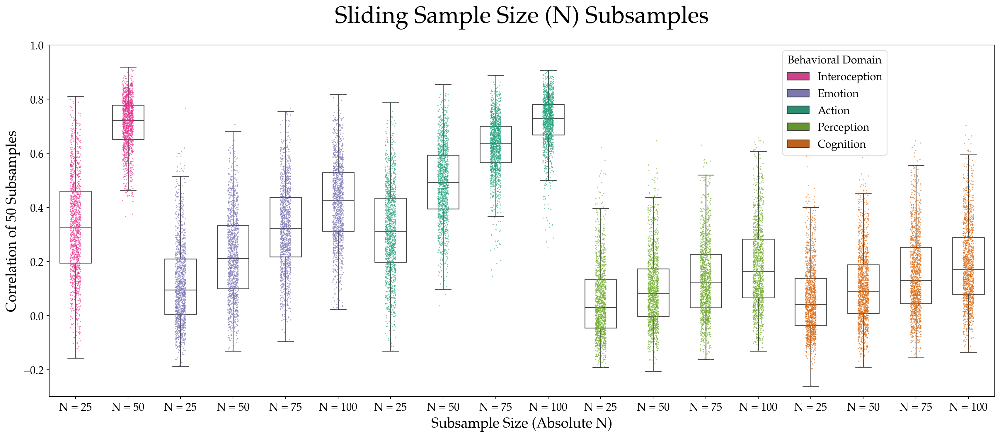

In [79]:
# Define custom labels for subsample sizes
subsample_labels = {
    'subsamples_n-25': 'N = 25',
    'subsamples_n-50': 'N = 50',
    'subsamples_n-75': 'N = 75',
    'subsamples_n-100': 'N = 100'
}

# Create a new figure and axes
fig, ax = plt.subplots(figsize=(18, 8))

# Make the background transparent
fig.patch.set_facecolor('none')
ax.patch.set_facecolor('none')

# Use a color palette that is mapped to BDs_order
colors = sns.color_palette("Dark2", n_colors=len(BDs))  # Maintain color correspondence with other figures
palette = {bd: color for bd, color in zip(BDs, colors)}

# Map the 'subsample_size' column to the custom labels
corrs_long['subsample_label'] = corrs_long['subsample_size'].map(subsample_labels)

# Sort 'corrs_long' DataFrame according to the order in 'BDs_order' and the mapped 'subsample_label'
corrs_long['domain'] = pd.Categorical(corrs_long['domain'], categories=BDs_order, ordered=True)
corrs_long['subsample_label'] = pd.Categorical(corrs_long['subsample_label'], categories=subsample_labels.values(), ordered=True)
corrs_long = corrs_long.sort_values(by=['domain', 'subsample_label'])

# Create a new column in corrs_long to store custom labels
corrs_long['custom_label'] = corrs_long.apply(lambda row: f'{row["subsample_label"]} - {row["domain"]}', axis=1)

# Create boxplots using the custom labels (includes domain info for boxplots)
sns.boxplot(data=corrs_long, x='custom_label', y='corr', hue='domain',
            showfliers=False, showcaps=True, width=0.6,
            boxprops={"facecolor": (1, 1, 1, 0)},  # Transparent boxplots
            ax=ax, palette=palette)

# Overlay stripplots to show underlying data as best as possible
sns.stripplot(data=corrs_long, x='custom_label', y='corr', hue='domain',
              jitter=0.1, s=1.5, alpha=0.6, dodge=False, ax=ax, palette=palette, legend=False)

# Compute median values for each BD and subsample size
median_data = corrs_long.groupby(['domain', 'subsample_label'])['corr'].median().reset_index()
sd_data = corrs_long.groupby(['domain', 'subsample_label'])['corr'].std().reset_index()

print(median_data)  # This can be used to connect median correlations per BD/Subsample combination. Also useful for reporting.
print(sd_data)

# Customize the axes
ax.set_xlabel('Subsample Size (Absolute N)', fontsize=18)
ax.set_ylabel('Correlation of 50 Subsamples', fontsize=18)
ax.set_title('Sliding Sample Size (N) Subsamples', y=1.05, fontsize=30)

# Modify the x-tick labels to only show the subsample size (N)
xtick_labels = [label.split(' - ')[0] for label in corrs_long['custom_label'].unique()]

# Add the x-tick labels
ax.set_xticks(range(len(xtick_labels)))
ax.set_xticklabels(xtick_labels, rotation=0, ha='center')

# Adjust the legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:len(BDs_order)], labels[:len(BDs_order)], title='Behavioral Domain', loc='upper left', bbox_to_anchor=(0.77, 1.00))

# Set consistent Y-axis limits
ax.set_ylim([-0.3, 1])

# Display the plot
plt.tight_layout()
plt.show()


In [80]:
# Decide if you want to save the median correlations per BD and subsample proportion
median_data.to_csv(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/Supplementary/Domains_Median-correlations_sliding-n.csv'), index=False)
sd_data.to_csv(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/Supplementary/Domains_SD-correlations_sliding-n.csv'), index=False)

/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/pandas/core/internals/blocks.py:2540: RuntimeWarning: invalid value encountered in cast
  values = values.astype(str)
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/pandas/core/internals/blocks.py:2540: RuntimeWarning: invalid value encountered in cast
  values = values.astype(str)


In [92]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/4a_Domains_SpatialCorrelations_sliding-n.png'), bbox_inches='tight')

# Sliding-Proportion Subsampling Stability

In [81]:
# Import data for each BD - here we have to specifiy the path of the subdirectories containing the different subsample proportions.

# These are the subsample directory names
subsample_dirs_p = ['subsamples_p-02', 'subsamples_p-04', 'subsamples_p-06', 'subsamples_p-08'] # Note that we reuse the p  subsampling from earlier, and hence it is simply called 'subsamples'.

analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}

# Loop through each  BD
for bd in BDs_order:
    zmaps[analysis][bd] = {subdir: [] for subdir in subsample_dirs_p}
    surf_zmaps[analysis][bd] = {subdir: [] for subdir in subsample_dirs_p}

    # Loop through each subsample directory
    for subdir in subsample_dirs_p:
        subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, subdir)
        
        # Loop through the 50 subsamples in the directory
        for subsample in tqdm(range(50)):
            zmap_path = os.path.join(subsamples_dir, str(subsample), 'uncorr_z.nii.gz')
            
            # Load the z-map and append to the respective lists
            zmaps[analysis][bd][subdir].append(nibabel.load(zmap_path))
            surf_zmaps[analysis][bd][subdir].append(SUITPy.flatmap.vol_to_surf(zmap_path, space='SPM').squeeze())
        
        # Convert the surface z-maps list to a numpy array for consistency
        surf_zmaps[analysis][bd][subdir] = np.array(surf_zmaps[analysis][bd][subdir])

# This should produce 20 rows (20 folders looped through) which all have 50 maps.

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 16.05it/s]


In [82]:
# Initialize dictionaries to store the correlations
corrs_p = {}
corrs_tril_p = {}

corrs_p[analysis] = {}
corrs_tril_p[analysis] = {}

# Loop through each brain dataset (BD)
for bd in BDs_order:
    corrs_p[analysis][bd] = {}
    corrs_tril_p[analysis][bd] = {}

    # Loop through each subsample directory seperately (so we can make 4 correlation boxplots for each BD)
    for subdir in subsample_dirs_p:
        # Calculate correlations for the current subsample directory
        corrs_p[analysis][bd][subdir] = np.corrcoef(surf_zmaps[analysis][bd][subdir])
        
        # Discard the diagonal and upper triangle
        corrs_tril_p[analysis][bd][subdir] = corrs_p[analysis][bd][subdir][np.tril_indices(50, -1)]

In [83]:
# Transform to long format

# Initialize a list to collect the data for long format. This help in organizing it so that BDs and subsamples are in seperate columns.
long_data_p = []

# Loop through each BD
for bd in BDs_order:
    # Loop through each subsample directory
    for subdir in subsample_dirs_p:
        # Get correlations for the current BD/Subsample size combination
        corrs_values = corrs_tril_p[analysis][bd][subdir]
        
        # Loop over each individual correlation pair and assign the correct values into long_data.
        for idx, corr_value in enumerate(corrs_values):
            # Append a dictionary with the relevant data
            long_data_p.append({
                'domain': bd,
                'subsample_size': subdir,
                'pair': idx,
                'corr': corr_value
            })

# Convert the dictionary list into a pandas DataFrame
corrs_long_p = pd.DataFrame(long_data_p)

# Check if data wrangling went as expected
corrs_long_p.head()

,domain,subsample_size,pair,corr
0,Interoception,subsamples_p-02,0,0.299886
1,Interoception,subsamples_p-02,1,0.128427
2,Interoception,subsamples_p-02,2,0.183394
3,Interoception,subsamples_p-02,3,0.169723
4,Interoception,subsamples_p-02,4,0.237277


/tmp/ipykernel_1811262/1991106398.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_data_p = corrs_long_p.groupby(['domain', 'subsample_size'])['corr'].median().reset_index()
/tmp/ipykernel_1811262/1991106398.py:49: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sd_data_p = corrs_long_p.groupby(['domain', 'subsample_size'])['corr'].std().reset_index()


           domain   subsample_size      corr
0   Interoception  subsamples_p-02  0.200705
1   Interoception  subsamples_p-04  0.383700
2   Interoception  subsamples_p-06  0.598650
3   Interoception  subsamples_p-08  0.806453
4         Emotion  subsamples_p-02  0.187512
5         Emotion  subsamples_p-04  0.361275
6         Emotion  subsamples_p-06  0.579161
7         Emotion  subsamples_p-08  0.780236
8          Action  subsamples_p-02  0.511668
9          Action  subsamples_p-04  0.742462
10         Action  subsamples_p-06  0.855682
11         Action  subsamples_p-08  0.940451
12     Perception  subsamples_p-02  0.121932
13     Perception  subsamples_p-04  0.265774
14     Perception  subsamples_p-06  0.473162
15     Perception  subsamples_p-08  0.689758
16      Cognition  subsamples_p-02  0.219652
17      Cognition  subsamples_p-04  0.505818
18      Cognition  subsamples_p-06  0.685905
19      Cognition  subsamples_p-08  0.874561
           domain   subsample_size      corr
0   Intero

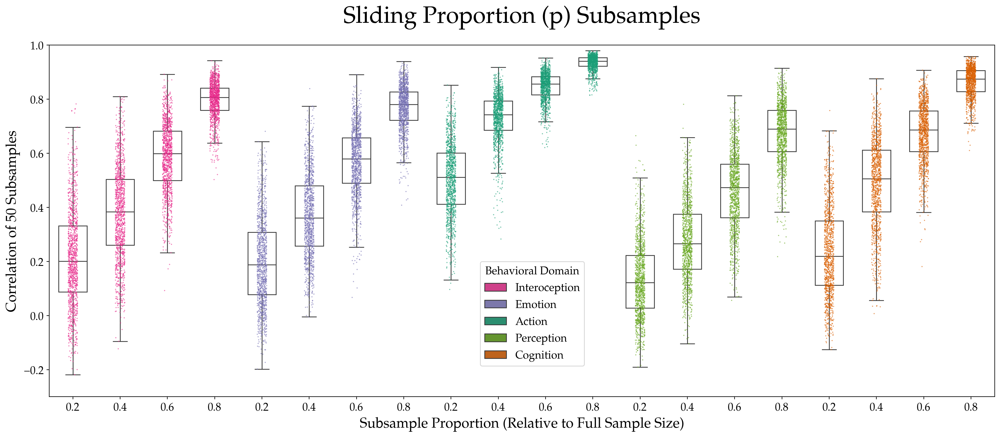

In [84]:
# Define custom labels for subsample sizes
subsample_labels_p = {
    'subsamples_p-02': '0.2',
    'subsamples_p-04': '0.4',
    'subsamples_p-06': '0.6',
    'subsamples_p-08': '0.8'
}

# Create a new figure and axes
fig, ax = plt.subplots(figsize=(18, 8))

# Make the background transparent
fig.patch.set_facecolor('none')
ax.patch.set_facecolor('none')

# Use a color palette that is mapped to BDs_order
colors = sns.color_palette("Dark2", n_colors=len(BDs)) # Note that we use the non-ordered color assignment to make them correspond to other figures.
palette = {bd: color for bd, color in zip(BDs, colors)}

# Sort 'corrs_long_p' DataFrame according to the order in 'BDs_order' and 'subsample_size'
corrs_long_p['domain'] = pd.Categorical(corrs_long_p['domain'], categories=BDs_order, ordered=True)
corrs_long_p['subsample_size'] = pd.Categorical(corrs_long_p['subsample_size'], categories=sorted(subsample_labels_p.keys()), ordered=True)
corrs_long_p = corrs_long_p.sort_values(by=['domain', 'subsample_size'])

# Initialize list to store custom x-tick labels
xtick_labels = []

# Create x-tick labels, looping over BDs_order and subsample directories
for bd in BDs_order:
    for subdir in sorted(subsample_labels_p.keys()):
        # Append the custom label to the list
        xtick_labels.append(f'{subsample_labels_p[str(subdir)]}')

# Create new column in corrs_long_p to store custom labels
corrs_long_p['custom_label'] = corrs_long_p.apply(lambda row: f'{row["domain"]} (N = {row["subsample_size"]})', axis=1)

# Create boxplots using new x-tick labels
sns.boxplot(data=corrs_long_p, x='custom_label', y='corr', hue='domain',
            showfliers=False, showcaps=True, width=0.6,
            boxprops={"facecolor": (1, 1, 1, 0)},  # Transparent boxplots
            ax=ax, palette=palette)

# Overlay stripplots to show underlying data as best as possible
sns.stripplot(data=corrs_long_p, x='custom_label', y='corr', hue='domain',
              jitter=0.1, s=1.5, alpha=0.6, dodge=False, ax=ax, palette=palette, legend=False)

# Compute median values for each BD and subsample size
median_data_p = corrs_long_p.groupby(['domain', 'subsample_size'])['corr'].median().reset_index()
sd_data_p = corrs_long_p.groupby(['domain', 'subsample_size'])['corr'].std().reset_index()

print(median_data_p)  # This can be used to connect median correlations per BD/Subsample combination. Also useful for reporting.
print(sd_data_p)

# Customize the axes
ax.set_xlabel('Subsample Proportion (Relative to Full Sample Size)', fontsize=18)
ax.set_ylabel('Correlation of 50 Subsamples', fontsize=18)
ax.set_title('Sliding Proportion (p) Subsamples', y=1.05,  fontsize=30)

# Add the x-tick labels
ax.set_xticks(range(len(xtick_labels)))
ax.set_xticklabels(xtick_labels, rotation=0, ha='center')

# Adjust the legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:len(BDs_order)], labels[:len(BDs_order)], title='Behavioral Domain', loc='upper left', bbox_to_anchor=(0.45, .4))

# Set consistent Y-axis limits
ax.set_ylim([-0.3, 1])

# Display the plot
plt.tight_layout()
plt.show()



In [85]:
# Decide if you want to save the median correlations per BD and subsample proportion
median_data_p.to_csv(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/Supplementary/Domains_Median-correlations_sliding-p.csv'), index=False)
sd_data_p.to_csv(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/Supplementary/Domains_SD-correlations_sliding-p.csv'), index=False)

In [100]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/4b_Domains_SpatialCorrelations_sliding-p.png'), bbox_inches='tight')

# Visualisation to show the percentage of subsamples that converge at every voxel per BD.

In [14]:
# Define a function to create the common SUITPy flatmap/ voxel heatmap.
def create_common_flatmap(surf_zmaps):
    # Total number of maps
    num_maps = len(surf_zmaps)
    
    # Print the shape of the first surf_map
    print("Shape of surf_zmaps[0]:", surf_zmaps[0].shape)
    
    # Initialize an empty array to store the count of subsamples per voxel
    count_subsamples = np.zeros_like(surf_zmaps[0])
    
    # Loop over each subsample map
    for surf_map in surf_zmaps:
        # Increment the count for each voxel where the value is greater than 0
        count_subsamples += (surf_map > 0)
    
    # Choose a random voxel and set its value to 100
    random_voxel = np.random.randint(0, count_subsamples.shape[0])
    count_subsamples[random_voxel] = 50 ## This is hacky since it assigns a random voxel the maximum value of 50/50 subsamples. We can fix this by assigning this to a fixed location and correcting the color after!

        
    # Calculate the proportion of maps > 0 as a percentage
    percent_maps = (count_subsamples / num_maps) * 100
    
    # Plot the common flatmap
    flatmap.plot(percent_maps, colorbar=True, cmap='hot', bordersize=0.5, bordercolor='white', new_figure=False)

In [15]:
def create_common_flatmap2(surf_zmaps, fixed_voxel=None, debug=False): # This also prints the maximum percentage of subsamples to reach convergence at any voxel per (sub)domain.
    # Total number of maps
    num_maps = len(surf_zmaps)
    
    # Optionally print the shape of the first surf_map
    if debug:
        print("Shape of surf_zmaps[0]:", surf_zmaps[0].shape)
    else:
        # Print the shape of the surf_map
        print(f"Shape of surf_zmaps[0] for: {bd}", surf_zmaps[0].shape)
    
    # Initialize an empty array to store the count of subsamples per voxel
    count_subsamples = np.zeros_like(surf_zmaps[0])
    
    # Loop over each subsample map
    for surf_map in surf_zmaps:
        # Since surf_map is already a NumPy array, we directly work with it
        count_subsamples += (surf_map > 0)
    
    # Calculate the proportion of maps > 0 as a percentage
    percent_maps = (count_subsamples / num_maps) * 100
    
    # Find the maximum value in count_subsamples
    max_value = np.max(count_subsamples)
    max_percentage = max_value*2

    # Choose a random voxel and set its value to 100
    random_voxel = np.random.randint(0, count_subsamples.shape[0])
    count_subsamples[random_voxel] = 50 ## This is hacky since it assigns a random voxel the maximum value of 50/50 subsamples. We can fix this by assigning this to a fixed location and correcting the color after!

    # Realculate the proportion of maps > 0 as a percentage. This sets the colorbars to 0-100 for all. Disable if undesired.
    percent_maps = (count_subsamples / num_maps) * 100
    
    # Plot the common flatmap
    flatmap.plot(percent_maps, colorbar=True, cmap='hot', bordersize=0.5, bordercolor='white', new_figure=False)
    
    # Print the maximum value
    print(f"Max Percentage: {max_percentage} for {bd}")
    
    # Return the maximum percentage found in count_subsamples
    return max_percentage

# First, the N = 50 subsamples.
## We focus on thresholded (p < 0.001 and K = 50) maps.

In [39]:
# Initialize dictionaries
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}

# Loop through each BD
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []

    # Define the subsample directories
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_n-50')
    
    # Check if the directory exists
    if not os.path.exists(subsamples_dir):
        print(f"Directory does not exist for BD '{bd}'. Skipping BD..")
        continue  # Skip to the next BD
    
    # If directory exists, proceed loading and processing data
    for subsample in tqdm(range(50), desc=f"Processing {bd}"):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
        
        # Check if files exist before attempting to load them
        if not os.path.exists(zmap_path):
            print(f"File '{zmap_path}' does not exist. Skipping subsample..")
            continue  # Skip to the next subsample
        
        # Load z-maps and append them to the lists
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space='SPM').squeeze())
    
    # Convert the z-maps list to a numpy array
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])


Processing Perception: 100%|███████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:02<00:00, 16.74it/s]


Shape of surf_zmaps[0] for: Interoception (28935,)
Max Percentage: 30.0 for Interoception
Shape of surf_zmaps[0] for: Emotion (28935,)
Max Percentage: 10.0 for Emotion
Shape of surf_zmaps[0] for: Action (28935,)
Max Percentage: 46.0 for Action
Shape of surf_zmaps[0] for: Perception (28935,)
Max Percentage: 4.0 for Perception
Shape of surf_zmaps[0] for: Cognition (28935,)
Max Percentage: 2.0 for Cognition


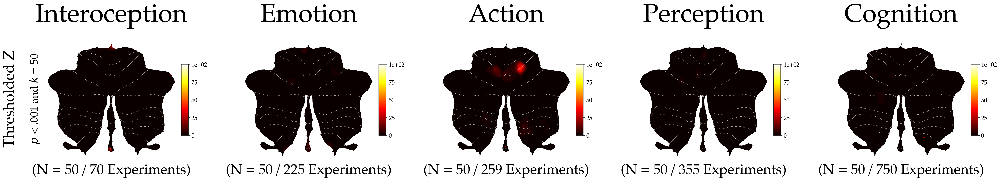

In [40]:
## Initialize the figure
fig = plt.figure(figsize=(40, 6))

# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1, 5, i + 1)
    
    # Check if the domain exists in the data
    if bd not in surf_zmaps[analysis] or len(surf_zmaps[analysis][bd]) == 0:
        print(f"No data available for {bd}. Plotting an empty plot in its place.")
        
        # Plot an empty plot for the missing domain
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)
    else:
        # Plot the actual data if available
        create_common_flatmap2(surf_zmaps[analysis][bd])
        ax.text(0.5, 0.0, f'(N = 50 / {BDs_exps[bd]} Experiments)', fontsize=33, ha='center', va='center', transform=ax.transAxes) # No need to plot this for the missing domain/subsampling combination.
    
    # Set the title and label for the plot, even if it's empty
    ax.set_title(f"{bd}", fontsize=60)
   

# Add a y-axis label to the main plot (if data was plotted)
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text(0.12, 0.5, '$\mathit{p}$ < .001 and $\mathit{k}$ = 50', va='center', ha='center', rotation='vertical', fontsize=25)

# Show the plot
plt.show()

In [105]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/Supplementary/Domains_voxel-heatmap_thres_N50.png'), bbox_inches='tight')

# N = 25 subsampling

In [41]:
# Initialize dictionaries
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}

# Loop through each BD
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []

    # Define the subsample directories
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_n-25')
    
    # Check if the directory exists
    if not os.path.exists(subsamples_dir):
        print(f"Directory does not exist for BD '{bd}'. Skipping BD..")
        continue  # Skip to the next BD
    
    # If directory exists, proceed loading and processing data
    for subsample in tqdm(range(50), desc=f"Processing {bd}"):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
        
        # Check if files exist before attempting to load them
        if not os.path.exists(zmap_path):
            print(f"File '{zmap_path}' does not exist. Skipping subsample..")
            continue  # Skip to the next subsample
        
        # Load z-maps and append them to the lists
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space='SPM').squeeze())
    
    # Convert the z-maps list to a numpy array
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])


Processing Perception: 100%|███████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 12.87it/s]


Shape of surf_zmaps[0] for: Interoception (28935,)
Max Percentage: 8.0 for Interoception
Shape of surf_zmaps[0] for: Emotion (28935,)
Max Percentage: 4.0 for Emotion
Shape of surf_zmaps[0] for: Action (28935,)
Max Percentage: 22.0 for Action
Shape of surf_zmaps[0] for: Perception (28935,)
Max Percentage: 4.0 for Perception
Shape of surf_zmaps[0] for: Cognition (28935,)
Max Percentage: 2.0 for Cognition


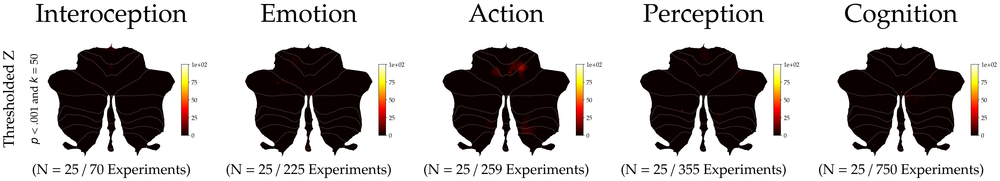

In [42]:
## Initialize the figure
fig = plt.figure(figsize=(40, 6))

# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1, 5, i + 1)
    
    # Check if the domain exists in the data
    if bd not in surf_zmaps[analysis] or len(surf_zmaps[analysis][bd]) == 0:
        print(f"No data available for {bd}. Plotting an empty plot in its place.")
        
        # Plot an empty plot for the missing domain
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)
    else:
        # Plot the actual data if available
        create_common_flatmap2(surf_zmaps[analysis][bd])
        ax.text(0.5, 0.0, f'(N = 25 / {BDs_exps[bd]} Experiments)', fontsize=33, ha='center', va='center', transform=ax.transAxes) # No need to plot this for the missing domain/subsampling combination.
    
    # Set the title and label for the plot, even if it's empty
    ax.set_title(f"{bd}", fontsize=60)
   

# Add a y-axis label to the main plot (if data was plotted)
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text(0.12, 0.5, '$\mathit{p}$ < .001 and $\mathit{k}$ = 50', va='center', ha='center', rotation='vertical', fontsize=25)

# Show the plot
plt.show()

In [108]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/Supplementary/Domains_voxel-heatmap_thres_N25.png'), bbox_inches='tight')

In [43]:
# Initialize dictionaries
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}

# Loop through each BD
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []

    # Define the subsample directories
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_n-75')
    
    # Check if the directory exists
    if not os.path.exists(subsamples_dir):
        print(f"Directory does not exist for BD '{bd}'. Skipping BD..")
        continue  # Skip to the next BD
    
    # If directory exists, proceed loading and processing data
    for subsample in tqdm(range(50), desc=f"Processing {bd}"):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
        
        # Check if files exist before attempting to load them
        if not os.path.exists(zmap_path):
            print(f"File '{zmap_path}' does not exist. Skipping subsample..")
            continue  # Skip to the next subsample
        
        # Load z-maps and append them to the lists
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space='SPM').squeeze())
    
    # Convert the z-maps list to a numpy array
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])


Processing Emotion: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:02<00:00, 16.75it/s]


Directory does not exist for BD 'Interoception'. Skipping BD..


Processing Perception: 100%|███████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:02<00:00, 16.73it/s]


No data available for Interoception. Plotting an empty plot in its place.
Shape of surf_zmaps[0] for: Emotion (28935,)
Max Percentage: 10.0 for Emotion
Shape of surf_zmaps[0] for: Action (28935,)
Max Percentage: 84.0 for Action
Shape of surf_zmaps[0] for: Perception (28935,)
Max Percentage: 2.0 for Perception
Shape of surf_zmaps[0] for: Cognition (28935,)
Max Percentage: 2.0 for Cognition


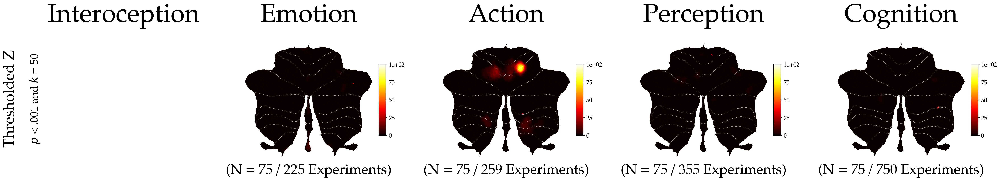

In [44]:
# Initialize the figure
fig = plt.figure(figsize=(40, 6))

# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1, 5, i + 1)
    
    # Check if the domain exists in the data
    if bd not in surf_zmaps[analysis] or len(surf_zmaps[analysis][bd]) == 0:
        print(f"No data available for {bd}. Plotting an empty plot in its place.")
        
        # Plot an empty plot for the missing domain
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)
    else:
        # Plot the actual data if available
        create_common_flatmap2(surf_zmaps[analysis][bd])
        ax.text(0.5, 0.0, f'(N = 75 / {BDs_exps[bd]} Experiments)', fontsize=33, ha='center', va='center', transform=ax.transAxes) # No need to plot this for the missing domain/subsampling combination.
    
    # Set the title and label for the plot, even if it's empty
    ax.set_title(f"{bd}", fontsize=60)
   

# Add a y-axis label to the main plot (if data was plotted)
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text(0.12, 0.5, '$\mathit{p}$ < .001 and $\mathit{k}$ = 50', va='center', ha='center', rotation='vertical', fontsize=25)

# Show the plot
plt.show()


In [111]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/Supplementary/Domains_voxel-heatmap_thres_N75.png'), bbox_inches='tight')

# N = 100 subsampling

In [45]:
# Initialize dictionaries
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}

# Loop through each BD
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []

    # Define the subsample directories
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_n-100')
    
    # Check if the directory exists
    if not os.path.exists(subsamples_dir):
        print(f"Directory does not exist for BD '{bd}'. Skipping BD..")
        continue  # Skip to the next BD
    
    # If directory exists, proceed loading and processing data
    for subsample in tqdm(range(50), desc=f"Processing {bd}"):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
        
        # Check if files exist before attempting to load them
        if not os.path.exists(zmap_path):
            print(f"File '{zmap_path}' does not exist. Skipping subsample..")
            continue  # Skip to the next subsample
        
        # Load z-maps and append them to the lists
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space='SPM').squeeze())
    
    # Convert the z-maps list to a numpy array
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])


Processing Emotion: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:02<00:00, 16.89it/s]


Directory does not exist for BD 'Interoception'. Skipping BD..


Processing Perception: 100%|███████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:02<00:00, 16.80it/s]


No data available for Interoception. Plotting an empty plot in its place.
Shape of surf_zmaps[0] for: Emotion (28935,)
Max Percentage: 6.0 for Emotion
Shape of surf_zmaps[0] for: Action (28935,)
Max Percentage: 94.0 for Action
Shape of surf_zmaps[0] for: Perception (28935,)
Max Percentage: 4.0 for Perception
Shape of surf_zmaps[0] for: Cognition (28935,)
Max Percentage: 4.0 for Cognition


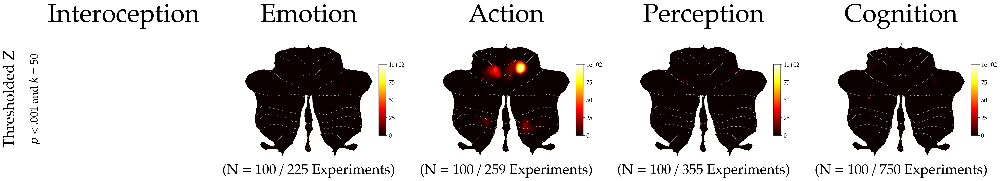

In [46]:
# Initialize the figure
fig = plt.figure(figsize=(40, 6))

# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1, 5, i + 1)
    
    # Check if the domain exists in the data
    if bd not in surf_zmaps[analysis] or len(surf_zmaps[analysis][bd]) == 0:
        print(f"No data available for {bd}. Plotting an empty plot in its place.")
        
        # Plot an empty plot for the missing domain
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)
    else:
        # Plot the actual data if available
        create_common_flatmap2(surf_zmaps[analysis][bd])
        ax.text(0.5, 0.0, f'(N = 100 / {BDs_exps[bd]} Experiments)', fontsize=33, ha='center', va='center', transform=ax.transAxes) # No need to plot this for the missing domain/subsampling combination.
    
    # Set the title and label for the plot, even if it's empty
    ax.set_title(f"{bd}", fontsize=60)
   

# Add a y-axis label to the main plot (if data was plotted)
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text(0.12, 0.5, '$\mathit{p}$ < .001 and $\mathit{k}$ = 50', va='center', ha='center', rotation='vertical', fontsize=25)

# Show the plot
plt.show()

In [115]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/Supplementary/Domains_voxel-heatmap_thres_N100.png'), bbox_inches='tight')

# Proportion = 0.2 subsampling

In [47]:
# Initialize dictionaries
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}

# Loop through each BD
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []

    # Define the subsample directories
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_p-02')
    
    # Check if the directory exists
    if not os.path.exists(subsamples_dir):
        print(f"Directory does not exist for BD '{bd}'. Skipping BD..")
        continue  # Skip to the next BD
    
    # If directory exists, proceed loading and processing data
    for subsample in tqdm(range(50), desc=f"Processing {bd}"):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
        
        # Check if files exist before attempting to load them
        if not os.path.exists(zmap_path):
            print(f"File '{zmap_path}' does not exist. Skipping subsample..")
            continue  # Skip to the next subsample
        
        # Load z-maps and append them to the lists
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space='SPM').squeeze())
    
    # Convert the z-maps list to a numpy array
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

Processing Perception: 100%|███████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:02<00:00, 16.69it/s]


In [48]:
# For the 0.2-proportional subsampling, add the number of experiments from the total (for plotting).
BDs_exps_sample = {
    'Action': 52,
    'Cognition': 150,
    'Emotion': 45,
    'Interoception': 14, # Not enough for proportion = 0.2 subsampling.
    'Perception': 71
}

Shape of surf_zmaps[0] for: Interoception (28935,)
Max Percentage: 6.0 for Interoception
Shape of surf_zmaps[0] for: Emotion (28935,)
Max Percentage: 6.0 for Emotion
Shape of surf_zmaps[0] for: Action (28935,)
Max Percentage: 52.0 for Action
Shape of surf_zmaps[0] for: Perception (28935,)
Max Percentage: 2.0 for Perception
Shape of surf_zmaps[0] for: Cognition (28935,)
Max Percentage: 8.0 for Cognition


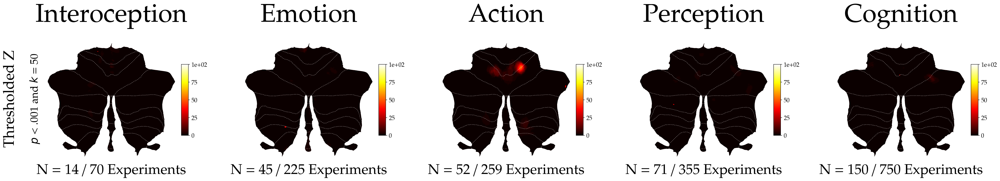

In [49]:
# Initialize the figure
fig = plt.figure(figsize=(40, 6))

# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1, 5, i + 1)
    
    # Check if the domain exists in the data
    if bd not in surf_zmaps[analysis] or len(surf_zmaps[analysis][bd]) == 0:
        print(f"No data available for {bd}. Plotting an empty plot in its place.")
        
        # Plot an empty plot for the missing domain
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)
    else:
        # Plot the actual data if available
        create_common_flatmap2(surf_zmaps[analysis][bd])
        ax.text(0.5, 0.0, f'N = {BDs_exps_sample[bd]} / {BDs_exps[bd]} Experiments', fontsize=33, ha='center', va='center', transform=ax.transAxes) # No need to plot this for the missing domain/subsampling combination.
    
    # Set the title and label for the plot, even if it's empty
    ax.set_title(f"{bd}", fontsize=60)
   

# Add a y-axis label to the main plot (if data was plotted)
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text(0.12, 0.5, '$\mathit{p}$ < .001 and $\mathit{k}$ = 50', va='center', ha='center', rotation='vertical', fontsize=25)

# Show the plot
plt.show()

In [120]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/4c_Domains_voxel-heatmap_thres_p02.png'), bbox_inches='tight')

# We can also visualize these heatmaps at different proportions. Starting with  p = 0.4.

In [50]:
# Initialize dictionaries
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}

# Loop through each BD
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []

    # Define the subsample directories
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_p-04')
    
    # Check if the directory exists
    if not os.path.exists(subsamples_dir):
        print(f"Directory does not exist for BD '{bd}'. Skipping BD..")
        continue  # Skip to the next BD
    
    # If directory exists, proceed loading and processing data
    for subsample in tqdm(range(50), desc=f"Processing {bd}"):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
        
        # Check if files exist before attempting to load them
        if not os.path.exists(zmap_path):
            print(f"File '{zmap_path}' does not exist. Skipping subsample..")
            continue  # Skip to the next subsample
        
        # Load z-maps and append them to the lists
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space='SPM').squeeze())
    
    # Convert the z-maps list to a numpy array
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

Processing Perception: 100%|███████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 16.28it/s]


In [51]:
BDs_exps_sample_04 = {
    'Action': 104,
    'Cognition': 300,
    'Emotion': 90,
    'Interoception': 28,
    'Perception': 104
}

Shape of surf_zmaps[0] for: Interoception (28935,)
Max Percentage: 12.0 for Interoception
Shape of surf_zmaps[0] for: Emotion (28935,)
Max Percentage: 10.0 for Emotion
Shape of surf_zmaps[0] for: Action (28935,)
Max Percentage: 96.0 for Action
Shape of surf_zmaps[0] for: Perception (28935,)
Max Percentage: 4.0 for Perception
Shape of surf_zmaps[0] for: Cognition (28935,)
Max Percentage: 22.0 for Cognition


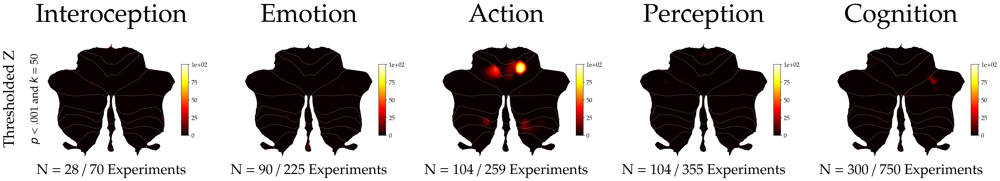

In [52]:
# Initialize the figure
fig = plt.figure(figsize=(40, 6))

# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1, 5, i + 1)
    
    # Check if the domain exists in the data
    if bd not in surf_zmaps[analysis] or len(surf_zmaps[analysis][bd]) == 0:
        print(f"No data available for {bd}. Plotting an empty plot in its place.")
        
        # Plot an empty plot for the missing domain
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)
    else:
        # Plot the actual data if available
        create_common_flatmap2(surf_zmaps[analysis][bd])
        ax.text(0.5, 0.0, f'N = {BDs_exps_sample_04[bd]} / {BDs_exps[bd]} Experiments', fontsize=33, ha='center', va='center', transform=ax.transAxes) # No need to plot this for the missing domain/subsampling combination.
    
    # Set the title and label for the plot, even if it's empty
    ax.set_title(f"{bd}", fontsize=60)
   

# Add a y-axis label to the main plot (if data was plotted)
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text(0.12, 0.5, '$\mathit{p}$ < .001 and $\mathit{k}$ = 50', va='center', ha='center', rotation='vertical', fontsize=25)

# Show the plot
plt.show()

In [123]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/4d_Domains_voxel-heatmap_thres_p04.png'), bbox_inches='tight')

# p = 0.6

In [53]:
# Initialize dictionaries
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}

# Loop through each BD
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []

    # Define the subsample directories
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_p-06')
    
    # Check if the directory exists
    if not os.path.exists(subsamples_dir):
        print(f"Directory does not exist for BD '{bd}'. Skipping BD..")
        continue  # Skip to the next BD
    
    # If directory exists, proceed loading and processing data
    for subsample in tqdm(range(50), desc=f"Processing {bd}"):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
        
        # Check if files exist before attempting to load them
        if not os.path.exists(zmap_path):
            print(f"File '{zmap_path}' does not exist. Skipping subsample..")
            continue  # Skip to the next subsample
        
        # Load z-maps and append them to the lists
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space='SPM').squeeze())
    
    # Convert the z-maps list to a numpy array
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

Processing Perception: 100%|███████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 16.40it/s]


In [54]:
BDs_exps_sample_06 = {
    'Action': 155,
    'Cognition': 450,
    'Emotion': 135,
    'Interoception': 42,
    'Perception': 213
}

Shape of surf_zmaps[0] for: Interoception (28935,)
Max Percentage: 26.0 for Interoception
Shape of surf_zmaps[0] for: Emotion (28935,)
Max Percentage: 4.0 for Emotion
Shape of surf_zmaps[0] for: Action (28935,)
Max Percentage: 100.0 for Action
Shape of surf_zmaps[0] for: Perception (28935,)
Max Percentage: 10.0 for Perception
Shape of surf_zmaps[0] for: Cognition (28935,)
Max Percentage: 26.0 for Cognition


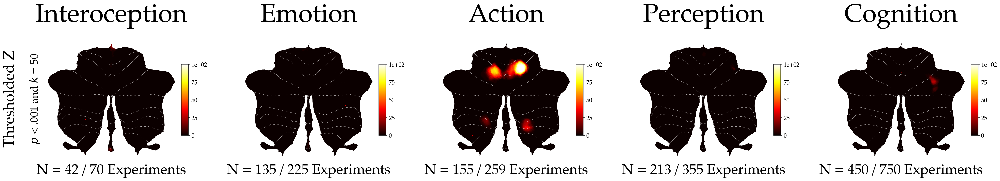

In [55]:
# Initialize the figure
fig = plt.figure(figsize=(40, 6))

# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1, 5, i + 1)
    
    # Check if the domain exists in the data
    if bd not in surf_zmaps[analysis] or len(surf_zmaps[analysis][bd]) == 0:
        print(f"No data available for {bd}. Plotting an empty plot in its place.")
        
        # Plot an empty plot for the missing domain
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)
    else:
        # Plot the actual data if available
        create_common_flatmap2(surf_zmaps[analysis][bd])
        ax.text(0.5, 0.0, f'N = {BDs_exps_sample_06[bd]} / {BDs_exps[bd]} Experiments', fontsize=33, ha='center', va='center', transform=ax.transAxes) # No need to plot this for the missing domain/subsampling combination.
    
    # Set the title and label for the plot, even if it's empty
    ax.set_title(f"{bd}", fontsize=60)
   

# Add a y-axis label to the main plot (if data was plotted)
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text(0.12, 0.5, '$\mathit{p}$ < .001 and $\mathit{k}$ = 50', va='center', ha='center', rotation='vertical', fontsize=25)

# Show the plot
plt.show()

In [127]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/4e_Domains_voxel-heatmap_thres_p06.png'), bbox_inches='tight')

# p = 0.8

In [56]:
# Initialize dictionaries
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}

# Loop through each BD
for bd in BDs:
    zmaps[analysis][bd] = []
    surf_zmaps[analysis][bd] = []

    # Define the subsample directories
    subsamples_dir = os.path.join(OUTPUT_DIR, analysis, bd, bd, 'subsamples_p-08')
    
    # Check if the directory exists
    if not os.path.exists(subsamples_dir):
        print(f"Directory does not exist for BD '{bd}'. Skipping BD..")
        continue  # Skip to the next BD
    
    # If directory exists, proceed loading and processing data
    for subsample in tqdm(range(50), desc=f"Processing {bd}"):
        zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
        
        # Check if files exist before attempting to load them
        if not os.path.exists(zmap_path):
            print(f"File '{zmap_path}' does not exist. Skipping subsample..")
            continue  # Skip to the next subsample
        
        # Load z-maps and append them to the lists
        zmaps[analysis][bd].append(nibabel.load(zmap_path))
        surf_zmaps[analysis][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space='SPM').squeeze())
    
    # Convert the z-maps list to a numpy array
    surf_zmaps[analysis][bd] = np.array(surf_zmaps[analysis][bd])

Processing Perception: 100%|███████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 16.58it/s]


In [57]:
BDs_exps_sample_08 = {
    'Action': 207,
    'Cognition': 600,
    'Emotion': 180,
    'Interoception': 56,
    'Perception': 284
}

Shape of surf_zmaps[0] for: Interoception (28935,)
Max Percentage: 32.0 for Interoception
Shape of surf_zmaps[0] for: Emotion (28935,)
Max Percentage: 2.0 for Emotion
Shape of surf_zmaps[0] for: Action (28935,)
Max Percentage: 100.0 for Action
Shape of surf_zmaps[0] for: Perception (28935,)
Max Percentage: 6.0 for Perception
Shape of surf_zmaps[0] for: Cognition (28935,)
Max Percentage: 36.0 for Cognition


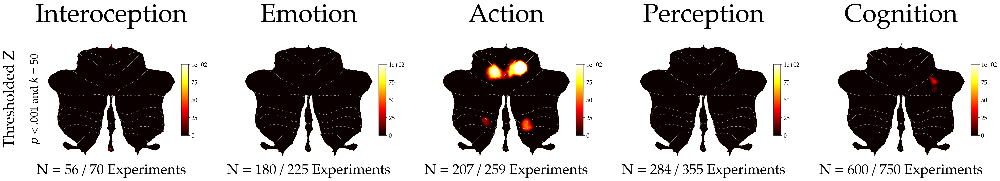

In [58]:
# Initialize the figure
fig = plt.figure(figsize=(40, 6))

# Loop over domains, creating plots that map the percentage of subsamples with values > 0 (voxel-by-voxel)
for i, bd in enumerate(BDs_order):
    ax = fig.add_subplot(1, 5, i + 1)
    
    # Check if the domain exists in the data
    if bd not in surf_zmaps[analysis] or len(surf_zmaps[analysis][bd]) == 0:
        print(f"No data available for {bd}. Plotting an empty plot in its place.")
        
        # Plot an empty plot for the missing domain
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)
    else:
        # Plot the actual data if available
        create_common_flatmap2(surf_zmaps[analysis][bd])
        ax.text(0.5, 0.0, f'N = {BDs_exps_sample_08[bd]} / {BDs_exps[bd]} Experiments', fontsize=33, ha='center', va='center', transform=ax.transAxes) # No need to plot this for the missing domain/subsampling combination.
    
    # Set the title and label for the plot, even if it's empty
    ax.set_title(f"{bd}", fontsize=60)
   

# Add a y-axis label to the main plot (if data was plotted)
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text(0.12, 0.5, '$\mathit{p}$ < .001 and $\mathit{k}$ = 50', va='center', ha='center', rotation='vertical', fontsize=25)

# Show the plot
plt.show()

In [131]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/4f_Domains_voxel-heatmap_thres_p08.png'), bbox_inches='tight')

# Last, we create the voxel-by-voxel convergence maps for subdomains as well.
## We only ran M = 50 and p = 0.2 subsampling here to not waste computational resources.

In [62]:
subdomains = ['Action.Execution', 'Cognition.Attention', 'Cognition.Language', 'Cognition.Language.Semantics', 'Cognition.Language.Speech', 'Cognition.Memory', 'Cognition.Memory.Explicit', 'Cognition.Memory.Working', 'Cognition.Reasoning', 'Emotion.Negative','Emotion.Positive', 'Emotion.Positive.RewardGain', 'Perception.Audition', 'Perception.Somesthesis', 'Perception.Somesthesis.Pain', 'Perception.Vision', 'Perception.Vision.Shape']


In [63]:
# Add the number of experiments per subdomain.
subdomains_exps = {'Action.Execution': 198,
                  'Cognition.Attention': 224,
                  'Cognition.Memory': 219,
                  'Cognition.Memory.Explicit': 102,
                  'Cognition.Language': 201,
                  'Cognition.Language.Semantics': 121,
                   'Cognition.Language.Speech': 83,
                  'Cognition.Memory.Working': 113,
                  'Cognition.Reasoning': 111,
                  'Emotion.Positive': 135,
                  'Emotion.Negative': 115,
                   'Emotion.Positive.RewardGain': 82,
                   'Perception.Audition': 61,
                   'Perception.Somesthesis': 90,
                   'Perception.Somesthesis.Pain': 65,
                  'Perception.Vision': 186,
                   'Perception.Vision.Shape': 65
}

In [64]:
subdomains_order = pd.Series(subdomains_exps).sort_values().index

In [65]:
# Add nicer labels 
subdomains_labels = {'Action.Execution': 'Execution', 
'Cognition.Attention': 'Attention', 'Cognition.Language': 'Language' , 'Cognition.Language.Semantics': 'Semantics', 'Cognition.Language.Speech': 'Speech', 
'Cognition.Memory': 'Memory', 'Cognition.Memory.Explicit': 'Explicit Memory', 'Cognition.Memory.Working': 'Working Memory', 'Cognition.Reasoning': 'Reasoning', 
'Emotion.Negative': 'Negative Emotion','Emotion.Positive': 'Positive Emotion', 'Emotion.Positive.RewardGain': 'Reward/ Gain', 
'Perception.Audition': 'Audition', 'Perception.Somesthesis': 'Somesthesis', 'Perception.Somesthesis.Pain': 'Pain', 'Perception.Vision': 'Vision', 'Perception.Vision.Shape': 'Vision - Shape'
  
}

# N = 50 first

In [66]:
# Initialize dictionaries
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}

# Loop through each domain and subdomain (now referred to as bd to work with the plotting function)
for domain in BDs_order:  # BDs_order contains domains
    zmaps[analysis][domain] = {}
    surf_zmaps[analysis][domain] = {}
    
    for bd in subdomains_order:  # bd refers to subdomains
        zmaps[analysis][domain][bd] = []
        surf_zmaps[analysis][domain][bd] = []
    
        # Define the subsample directories
        subsamples_dir = os.path.join(OUTPUT_DIR, analysis, domain, bd, 'subsamples_n-50')
        
        # Check if the directory exists
        if not os.path.exists(subsamples_dir):
            print(f"Directory does not exist for Domain '{domain}', BD '{bd}'. Skipping BD..")
            continue  # Skip to the next BD
        
        # If directory exists, proceed to loading and processing data
        for subsample in tqdm(range(50), desc=f"Processing {domain} - {bd}"):
            zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
            
            # Check if files exist before attempting to load them
            if not os.path.exists(zmap_path):
                print(f"File '{zmap_path}' does not exist. Skipping subsample..")
                continue  # Skip to the next subsample
            
            # Load z-maps and append them to lists
            zmaps[analysis][domain][bd].append(nibabel.load(zmap_path))
            surf_zmaps[analysis][domain][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space='SPM').squeeze())
        
        # Convert the z-maps list to a numpy array
        surf_zmaps[analysis][domain][bd] = np.array(surf_zmaps[analysis][domain][bd])



Directory does not exist for Domain 'Interoception', BD 'Perception.Audition'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Perception.Vision.Shape'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Perception.Somesthesis.Pain'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Emotion.Positive.RewardGain'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Cognition.Language.Speech'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Perception.Somesthesis'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Cognition.Memory.Explicit'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Cognition.Reasoning'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Cognition.Memory.Working'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Emotion.Negative'. Skipping BD..
Directory does not exist for Doma

Processing Emotion - Emotion.Positive.RewardGain: 100%|████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 31.60it/s]


Directory does not exist for Domain 'Emotion', BD 'Cognition.Language.Speech'. Skipping BD..
Directory does not exist for Domain 'Emotion', BD 'Perception.Somesthesis'. Skipping BD..
Directory does not exist for Domain 'Emotion', BD 'Cognition.Memory.Explicit'. Skipping BD..
Directory does not exist for Domain 'Emotion', BD 'Cognition.Reasoning'. Skipping BD..
Directory does not exist for Domain 'Emotion', BD 'Cognition.Memory.Working'. Skipping BD..


Processing Emotion - Emotion.Negative: 100%|███████████████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 32.22it/s]


Directory does not exist for Domain 'Emotion', BD 'Cognition.Language.Semantics'. Skipping BD..


Processing Emotion - Emotion.Positive: 100%|███████████████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 31.64it/s]


Directory does not exist for Domain 'Emotion', BD 'Perception.Vision'. Skipping BD..
Directory does not exist for Domain 'Emotion', BD 'Action.Execution'. Skipping BD..
Directory does not exist for Domain 'Emotion', BD 'Cognition.Language'. Skipping BD..
Directory does not exist for Domain 'Emotion', BD 'Cognition.Memory'. Skipping BD..
Directory does not exist for Domain 'Emotion', BD 'Cognition.Attention'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Perception.Audition'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Perception.Vision.Shape'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Perception.Somesthesis.Pain'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Emotion.Positive.RewardGain'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Cognition.Language.Speech'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Perception.Somesthesis'. Skipping BD..
Directory does not exist for 

Processing Action - Action.Execution: 100%|████████████████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 30.55it/s]


Directory does not exist for Domain 'Action', BD 'Cognition.Language'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Cognition.Memory'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Cognition.Attention'. Skipping BD..


Processing Perception - Perception.Vision.Shape: 100%|█████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 29.51it/s]
Processing Perception - Perception.Somesthesis.Pain: 100%|█████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 32.15it/s]


Directory does not exist for Domain 'Perception', BD 'Emotion.Positive.RewardGain'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Cognition.Language.Speech'. Skipping BD..


Processing Perception - Perception.Somesthesis: 100%|██████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 32.89it/s]


Directory does not exist for Domain 'Perception', BD 'Cognition.Memory.Explicit'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Cognition.Reasoning'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Cognition.Memory.Working'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Emotion.Negative'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Cognition.Language.Semantics'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Emotion.Positive'. Skipping BD..


Processing Perception - Perception.Vision: 100%|███████████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 32.46it/s]


Directory does not exist for Domain 'Perception', BD 'Action.Execution'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Cognition.Language'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Cognition.Memory'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Cognition.Attention'. Skipping BD..
Directory does not exist for Domain 'Cognition', BD 'Perception.Audition'. Skipping BD..
Directory does not exist for Domain 'Cognition', BD 'Perception.Vision.Shape'. Skipping BD..
Directory does not exist for Domain 'Cognition', BD 'Perception.Somesthesis.Pain'. Skipping BD..
Directory does not exist for Domain 'Cognition', BD 'Emotion.Positive.RewardGain'. Skipping BD..


Processing Cognition - Cognition.Language.Speech: 100%|████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 32.02it/s]


Directory does not exist for Domain 'Cognition', BD 'Perception.Somesthesis'. Skipping BD..


Processing Cognition - Cognition.Memory.Working: 100%|█████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 32.33it/s]


Directory does not exist for Domain 'Cognition', BD 'Emotion.Negative'. Skipping BD..


Processing Cognition - Cognition.Language.Semantics: 100%|█████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 32.23it/s]


Directory does not exist for Domain 'Cognition', BD 'Emotion.Positive'. Skipping BD..
Directory does not exist for Domain 'Cognition', BD 'Perception.Vision'. Skipping BD..
Directory does not exist for Domain 'Cognition', BD 'Action.Execution'. Skipping BD..


Processing Cognition - Cognition.Attention: 100%|██████████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 32.07it/s]


No data available for Domain 'Action', BD 'Perception.Audition'. Skipping this plot.
No data available for Domain 'Action', BD 'Perception.Vision.Shape'. Skipping this plot.
No data available for Domain 'Action', BD 'Perception.Somesthesis.Pain'. Skipping this plot.
No data available for Domain 'Action', BD 'Emotion.Positive.RewardGain'. Skipping this plot.
No data available for Domain 'Action', BD 'Cognition.Language.Speech'. Skipping this plot.
No data available for Domain 'Action', BD 'Perception.Somesthesis'. Skipping this plot.
No data available for Domain 'Action', BD 'Cognition.Memory.Explicit'. Skipping this plot.
No data available for Domain 'Action', BD 'Cognition.Reasoning'. Skipping this plot.
No data available for Domain 'Action', BD 'Cognition.Memory.Working'. Skipping this plot.
No data available for Domain 'Action', BD 'Emotion.Negative'. Skipping this plot.
No data available for Domain 'Action', BD 'Cognition.Language.Semantics'. Skipping this plot.
No data available f

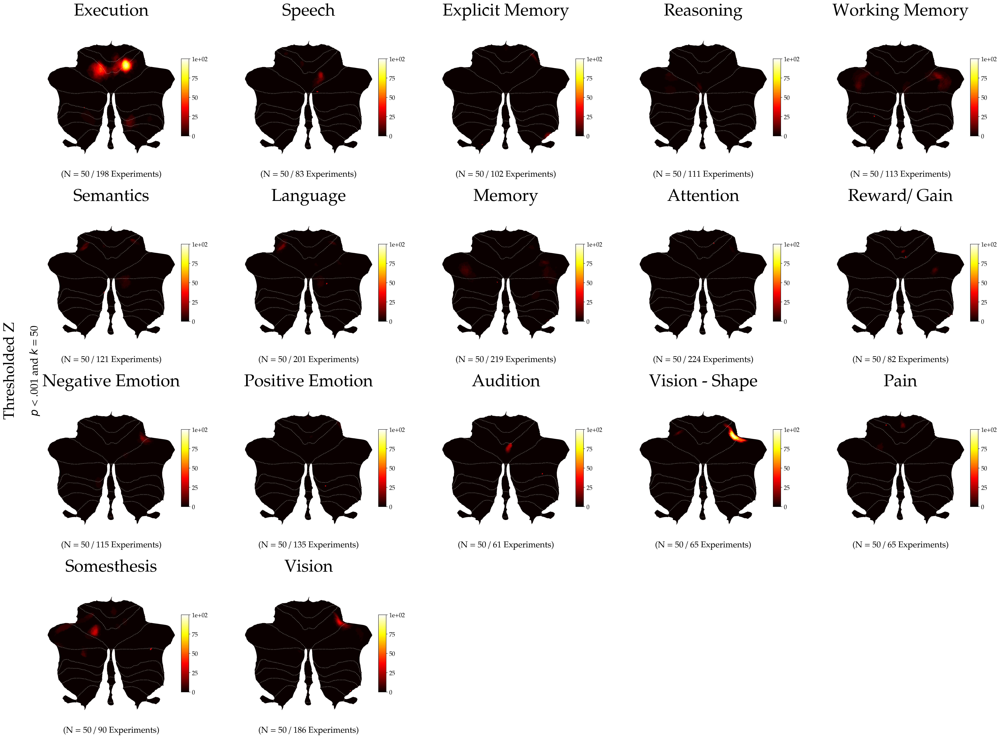

In [67]:
# Initialize the figure
fig = plt.figure(figsize=(40, 30))

# Plot counter
plot_count = 0

# Loop over domains and subdomains, creating plots only for available data
for domain in BDs:
    for bd in subdomains_order:
        
        # Check if the bd (subdomain) exists in the data and has content
        if bd not in surf_zmaps[analysis][domain] or len(surf_zmaps[analysis][domain][bd]) == 0:
            print(f"No data available for Domain '{domain}', BD '{bd}'. Skipping this plot.")
            continue  # Skip this bd
        
        # Increase the plot counter since we are plotting this bd
        plot_count += 1
        
        # Dynamically create subplot based on the plot count
        ax = fig.add_subplot(4, 5, plot_count)
        
        # Plot the actual data if available
        create_common_flatmap2(surf_zmaps[analysis][domain][bd])
        ax.text(0.5, 0.0, f'(N = 50 / {subdomains_exps[bd]} Experiments)', fontsize=20, ha='center', va='center', transform=ax.transAxes)
        
        # Set the title and label for the plot
        ax.set_title(subdomains_labels[bd], fontsize=40)
    
# Add a y-axis label to the main plot (outside of the loop)
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text(0.12, 0.5, '$\mathit{p}$ < .001 and $\mathit{k}$ = 50', va='center', ha='center', rotation='vertical', fontsize=25)

# Show the plot
plt.show()




In [68]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/Supplementary/Subomains_voxel-heatmap_thres_n50.png'), bbox_inches='tight')

# P = 0.2

In [69]:
subdomains = ['Action.Execution', 'Cognition.Attention', 'Cognition.Language', 'Cognition.Language.Semantics', 'Cognition.Language.Speech', 'Cognition.Memory', 'Cognition.Memory.Explicit', 'Cognition.Memory.Working', 'Cognition.Reasoning', 'Emotion.Negative','Emotion.Positive', 'Emotion.Positive.RewardGain', 'Perception.Somesthesis', 'Perception.Vision']


In [70]:
# Add the number of experiments per subdomain.
subdomains_exps = {'Action.Execution': 198,
                  'Cognition.Attention': 224,
                  'Cognition.Memory': 219,
                  'Cognition.Memory.Explicit': 102,
                  'Cognition.Language': 201,
                  'Cognition.Language.Semantics': 121,
                   'Cognition.Language.Speech': 83,
                  'Cognition.Memory.Working': 113,
                  'Cognition.Reasoning': 111,
                  'Emotion.Positive': 135,
                  'Emotion.Negative': 115,
                    # 'Emotion.Positive.RewardGain': 82,
                   'Perception.Somesthesis': 90,
                  'Perception.Vision': 186,
}

In [71]:
subdomains_order = pd.Series(subdomains_exps).sort_values().index

In [72]:
# Add the number of experiments per subdomain.
subdomains_exps_sample = {'Action.Execution': 40,
                  'Cognition.Attention': 45,
                  'Cognition.Memory': 44,
                  'Cognition.Memory.Explicit': 20,
                  'Cognition.Language': 40,
                  'Cognition.Language.Semantics': 24,
                   'Cognition.Language.Speech': 17,
                  'Cognition.Memory.Working': 23,
                  'Cognition.Reasoning': 22,
                  'Emotion.Positive': 27,
                  'Emotion.Negative': 23,
                   # 'Emotion.Positive.RewardGain': 16, # Too small.
                   'Perception.Somesthesis': 18,
                  'Perception.Vision': 37,
}

In [73]:
# Add nicer labels 
subdomains_labels = {'Action.Execution': 'Execution', 
'Cognition.Attention': 'Attention', 'Cognition.Language': 'Language' , 'Cognition.Language.Semantics': 'Semantics', 'Cognition.Language.Speech': 'Speech', 
'Cognition.Memory': 'Memory', 'Cognition.Memory.Explicit': 'Explicit Memory', 'Cognition.Memory.Working': 'Working Memory', 'Cognition.Reasoning': 'Reasoning', 
'Emotion.Negative': 'Negative Emotion','Emotion.Positive': 'Positive Emotion', 'Emotion.Positive.RewardGain': 'Reward/ Gain', 
'Perception.Somesthesis': 'Somesthesis', 'Perception.Vision': 'Vision'
  
}

In [74]:
# Initialize dictionaries
analysis = 'SALE'
zmaps[analysis] = {}
surf_zmaps[analysis] = {}

# Loop through each domain and subdomain (now referred to as bd to work with the plotting function)
for domain in BDs_order:  # BDs_order contains domains
    zmaps[analysis][domain] = {}
    surf_zmaps[analysis][domain] = {}
    
    for bd in subdomains_order:  # bd refers to subdomains
        zmaps[analysis][domain][bd] = []
        surf_zmaps[analysis][domain][bd] = []
    
        # Define the subsample directories
        subsamples_dir = os.path.join(OUTPUT_DIR, analysis, domain, bd, 'subsamples_p-02')
        
        # Check if the directory exists
        if not os.path.exists(subsamples_dir):
            print(f"Directory does not exist for Domain '{domain}', BD '{bd}'. Skipping BD..")
            continue  # Skip to the next BD
        
        # If directory exists, proceed to loading and processing data
        for subsample in tqdm(range(50), desc=f"Processing {domain} - {bd}"):
            zmap_path = os.path.join(subsamples_dir, str(subsample), 'corr_cluster_k-50_z.nii.gz')
            
            # Check if files exist before attempting to load them
            if not os.path.exists(zmap_path):
                print(f"File '{zmap_path}' does not exist. Skipping subsample..")
                continue  # Skip to the next subsample
            
            # Load z-maps and append them to lists
            zmaps[analysis][domain][bd].append(nibabel.load(zmap_path))
            surf_zmaps[analysis][domain][bd].append(SUITPy.flatmap.vol_to_surf(zmap_path, space='SPM').squeeze())
        
        # Convert the z-maps list to a numpy array
        surf_zmaps[analysis][domain][bd] = np.array(surf_zmaps[analysis][domain][bd])


Directory does not exist for Domain 'Interoception', BD 'Cognition.Language.Speech'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Perception.Somesthesis'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Cognition.Memory.Explicit'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Cognition.Reasoning'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Cognition.Memory.Working'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Emotion.Negative'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Cognition.Language.Semantics'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Emotion.Positive'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Perception.Vision'. Skipping BD..
Directory does not exist for Domain 'Interoception', BD 'Action.Execution'. Skipping BD..
Directory does not exist for Domain 'Interoception',

Processing Emotion - Emotion.Negative: 100%|███████████████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 31.80it/s]


Directory does not exist for Domain 'Emotion', BD 'Cognition.Language.Semantics'. Skipping BD..


Processing Emotion - Emotion.Positive: 100%|███████████████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 30.91it/s]


Directory does not exist for Domain 'Emotion', BD 'Perception.Vision'. Skipping BD..
Directory does not exist for Domain 'Emotion', BD 'Action.Execution'. Skipping BD..
Directory does not exist for Domain 'Emotion', BD 'Cognition.Language'. Skipping BD..
Directory does not exist for Domain 'Emotion', BD 'Cognition.Memory'. Skipping BD..
Directory does not exist for Domain 'Emotion', BD 'Cognition.Attention'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Cognition.Language.Speech'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Perception.Somesthesis'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Cognition.Memory.Explicit'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Cognition.Reasoning'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Cognition.Memory.Working'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Emotion.Negative'. Skipping BD..
Directory does not exist for Domain 'Acti

Processing Action - Action.Execution: 100%|████████████████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 30.43it/s]


Directory does not exist for Domain 'Action', BD 'Cognition.Language'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Cognition.Memory'. Skipping BD..
Directory does not exist for Domain 'Action', BD 'Cognition.Attention'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Cognition.Language.Speech'. Skipping BD..


Processing Perception - Perception.Somesthesis: 100%|██████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 29.49it/s]


Directory does not exist for Domain 'Perception', BD 'Cognition.Memory.Explicit'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Cognition.Reasoning'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Cognition.Memory.Working'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Emotion.Negative'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Cognition.Language.Semantics'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Emotion.Positive'. Skipping BD..


Processing Perception - Perception.Vision: 100%|███████████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 30.78it/s]


Directory does not exist for Domain 'Perception', BD 'Action.Execution'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Cognition.Language'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Cognition.Memory'. Skipping BD..
Directory does not exist for Domain 'Perception', BD 'Cognition.Attention'. Skipping BD..


Processing Cognition - Cognition.Language.Speech: 100%|████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 32.38it/s]


Directory does not exist for Domain 'Cognition', BD 'Perception.Somesthesis'. Skipping BD..


Processing Cognition - Cognition.Memory.Working: 100%|█████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 31.90it/s]


Directory does not exist for Domain 'Cognition', BD 'Emotion.Negative'. Skipping BD..


Processing Cognition - Cognition.Language.Semantics: 100%|█████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 30.92it/s]


Directory does not exist for Domain 'Cognition', BD 'Emotion.Positive'. Skipping BD..
Directory does not exist for Domain 'Cognition', BD 'Perception.Vision'. Skipping BD..
Directory does not exist for Domain 'Cognition', BD 'Action.Execution'. Skipping BD..


Processing Cognition - Cognition.Attention: 100%|██████████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 31.81it/s]


No data available for Domain 'Action', BD 'Cognition.Language.Speech'. Skipping this plot.
No data available for Domain 'Action', BD 'Perception.Somesthesis'. Skipping this plot.
No data available for Domain 'Action', BD 'Cognition.Memory.Explicit'. Skipping this plot.
No data available for Domain 'Action', BD 'Cognition.Reasoning'. Skipping this plot.
No data available for Domain 'Action', BD 'Cognition.Memory.Working'. Skipping this plot.
No data available for Domain 'Action', BD 'Emotion.Negative'. Skipping this plot.
No data available for Domain 'Action', BD 'Cognition.Language.Semantics'. Skipping this plot.
No data available for Domain 'Action', BD 'Emotion.Positive'. Skipping this plot.
No data available for Domain 'Action', BD 'Perception.Vision'. Skipping this plot.
Shape of surf_zmaps[0] for: Action.Execution (28935,)
Max Percentage: 72.0 for Action.Execution
No data available for Domain 'Action', BD 'Cognition.Language'. Skipping this plot.
No data available for Domain 'Acti

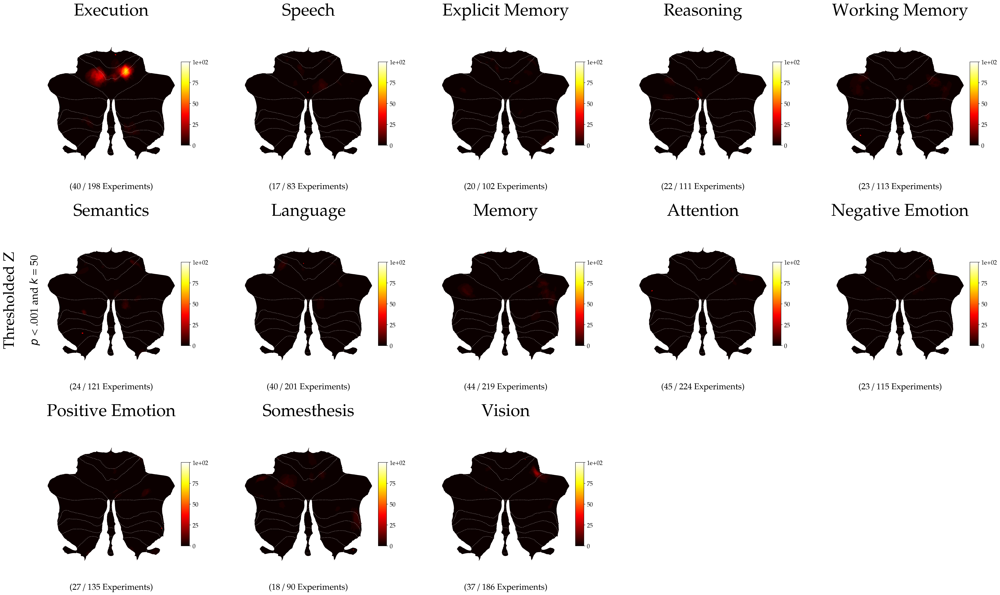

In [77]:
# Initialize the figure
fig = plt.figure(figsize=(40, 24))

# Plot counter
plot_count = 0

# Loop over domains and subdomains, creating plots only for available data
for domain in BDs:
    for bd in subdomains_order:
        
        # Check if the bd (subdomain) exists in the data and has content
        if bd not in surf_zmaps[analysis][domain] or len(surf_zmaps[analysis][domain][bd]) == 0:
            print(f"No data available for Domain '{domain}', BD '{bd}'. Skipping this plot.")
            continue  # Skip this bd
        
        # Increase the plot counter since we are plotting this bd
        plot_count += 1
        
        # Dynamically create subplot based on the plot count
        ax = fig.add_subplot(3, 5, plot_count)
        
        # Plot the actual data if available
        create_common_flatmap2(surf_zmaps[analysis][domain][bd])
        ax.text(0.5, 0.0, f'({subdomains_exps_sample[bd]} / {subdomains_exps[bd]} Experiments)', fontsize=20, ha='center', va='center', transform=ax.transAxes)
        
        # Set the title and label for the plot
        ax.set_title(subdomains_labels[bd], fontsize=40)
    
# Add a y-axis label to the main plot (outside of the loop)
fig.text(0.1, 0.5, 'Thresholded Z', va='center', ha='center', rotation='vertical', fontsize=35)
fig.text(0.12, 0.5, '$\mathit{p}$ < .001 and $\mathit{k}$ = 50', va='center', ha='center', rotation='vertical', fontsize=25)

# Show the plot
plt.show()


In [78]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure4/Supplementary/Subomains_voxel-heatmap_thres_p02.png'), bbox_inches='tight')

# The End.